<p align="center">
    <img src="https://github.com/GeostatsGuy/GeostatsPy/blob/master/TCG_color_logo.png?raw=true" width="220" height="240" />

</p>


### CCUS Global GOM Spatial GeoAnalytics Workflow

## CCUS4 Normalization

#### Michael Pyrcz, Associate Professor

### The University of Texas at Austin

#### Michael's Contacts: [Twitter/@GeostatsGuy](https://twitter.com/geostatsguy) | [GitHub/GeostatsGuy](https://github.com/GeostatsGuy) | [www.michaelpyrcz.com](http://michaelpyrcz.com) | [GoogleScholar](https://scholar.google.com/citations?user=QVZ20eQAAAAJ&hl=en&oi=ao) | [Book](https://www.amazon.com/Geostatistical-Reservoir-Modeling-Michael-Pyrcz/dp/0199731446)

#### Murray Christie

### S&P Global


#### Robust Data Analytics and Machine Learning Workflow for Basin-Scale Carbon Storage Potential Sweet Spot Spotting

##### Challenges:

* Combining multiple data sources?

* Big data analytics, visualization and domain expertise driven-insights

* What matters? Advanced feature selection.

* Consistent mapping of CS potential?

##### Workflows:

1. Flexibility to filter well data by:

    * Constants
    * Conditional to depth outliers

2. Data Visualization:

    * Feature by depth with conditional intervals
    * Data points and data density (2D histograms)
    * Proportion of data retained and filtered (2D histograms)
    * Conditional expectation for trend models

#### Import Required Packages

We will need some standard packages. These should have been installed with Anaconda 3.

In [1]:
%matplotlib inline

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import path
from matplotlib.colors import ListedColormap
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator) # control of axes ticks
from matplotlib.patches import Ellipse
from matplotlib.patches import Rectangle            # drawing shapes on plots
plt.rc('axes', axisbelow=True)                      # set axes and grids in the background for all plots
import seaborn as sns                               # for matrix scatter plots
import os
import re
from scipy import linalg                            # for linear regression
from scipy.interpolate import make_interp_spline, BSpline
from scipy import stats                             # summary statistics
import scipy.signal as signal                       # kernel for moving window calculation
from sklearn.feature_selection import mutual_info_regression
from sklearn.ensemble import RandomForestRegressor  # feature imputation
import math
       
import pickle                                       # save anad load scikit-learn models
        
import warnings
warnings.filterwarnings('ignore')

#from pyproj import Proj                             # projection from lat / long to northing / easting 
#myproj = Proj(proj='utm',zone='15',ellps='WGS84', preserve_units=False)  

cmap = plt.cm.inferno

C:\Users\pm27995\Anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\pm27995\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.GK7GX5KEQ4F6UYO3P26ULGBQYHGQO7J4.gfortran-win_amd64.dll
C:\Users\pm27995\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.XWYDX2IKJW2NMTWSFYNGFUWKQU3LYTCZ.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


#### Custom Colormap

In [2]:
# make a custom colormap
my_colormap = plt.cm.get_cmap('RdBu_r', 256)
newcolors = my_colormap(np.linspace(0, 1, 256))
white = np.array([250/256, 250/256, 250/256, 1])
#newcolors[26:230, :] = white                        # mask all correlations less than abs(0.8)
newcolors[56:200, :] = white                          # mask all correlations less than abs(0.6)
signif = ListedColormap(newcolors)

my_colormap2 = plt.cm.get_cmap('inferno', 256)
newcolors2 = my_colormap2(np.linspace(0, 1, 256))
newcolors2[0:5, :] = white                          # mask all correlations less than abs(0.6)
mask_inferno = ListedColormap(newcolors2)

my_colormap3 = plt.cm.get_cmap('inferno_r', 256) 
newcolors3 = my_colormap3(np.linspace(0, 1, 256))
newcolors3[0:5, :] = white                          # mask all correlations less than abs(0.6)
mask_inferno_r = ListedColormap(newcolors3)

#### Declare Functions

These include:

* convenience functions for extracting, calculating and ploting the polygons (single polygons and multipolygons) stored as strings in the DataFrame

* partial correlation and mutual information functions for enhanced correlation analysis

In [3]:
from numba import jit  # for numerical speed up

def add_grid():
    plt.grid(True, which='major',linewidth = 1.0); plt.grid(True, which='minor',linewidth = 0.2) # add y grids
    plt.tick_params(which='major',length=7); plt.tick_params(which='minor', length=4)
    plt.gca().xaxis.set_minor_locator(AutoMinorLocator()); plt.gca().yaxis.set_minor_locator(AutoMinorLocator()) # turn on minor ticks

def partial_corr(C): # function by Fabian Pedregosa-Izquierdo, f@bianp.net for partial correlation
#    Returns the sample linear partial correlation coefficients between pairs of variables in C, controlling 
#    for the remaining variables in C.

#    Parameters
#    C : array-like, shape (n, p)
#        Array with the different variables. Each column of C is taken as a variable
#    Returns
#    P : array-like, shape (p, p)
#        P[i, j] contains the partial correlation of C[:, i] and C[:, j] controlling
#        for the remaining variables in C.

    C = np.asarray(C)
    p = C.shape[1]
    P_corr = np.zeros((p, p), dtype=np.float)
    for i in range(p):
        P_corr[i, i] = 1
        for j in range(i+1, p):
            idx = np.ones(p, dtype=np.bool)
            idx[i] = False
            idx[j] = False
            beta_i = linalg.lstsq(C[:, idx], C[:, j])[0]
            beta_j = linalg.lstsq(C[:, idx], C[:, i])[0]
            res_j = C[:, j] - C[:, idx].dot( beta_i)
            res_i = C[:, i] - C[:, idx].dot(beta_j)
            corr = stats.pearsonr(res_i, res_j)[0]
            P_corr[i, j] = corr
            P_corr[j, i] = corr
    return P_corr
    
def cond_prob_plot(pred,pmin,pmax,pname,punit,nbins,resp,rmin,rmax,rname,runit):
    if np.any(np.isnan(pred)) or np.any(np.isnan(resp)):
        print('NaN values in one or both of the input ndarrays'); return None,None,None
    
    nbins = nbins + 1
    bins = np.linspace(pmin,pmax,nbins)            # set the bin boundaries and then the centroids for plotting
    centroids = np.linspace((bins[0]+bins[1])*0.5,(bins[nbins-2]+bins[nbins-1])*0.5,nbins-1)
    pnew = np.linspace(pmin,pmax,1000) 
    
    def percentile(n):
        def percentile_(x):
            return np.percentile(x, n)
        percentile_.__name__ = 'percentile_%s' % n
        return percentile_
    
    df_temp = pd.DataFrame({pname:pred,rname:resp})
    
    df_temp['bins'] = pd.cut(df_temp[pname], bins,labels = centroids) # cut on bondaries and lable with centroids 
    
    
    #cond_exp = df_temp.groupby('bins')[rname].mean()
    cond_P50 = df_temp.groupby('bins')[rname].agg([percentile(50)])
    cond_P40 = df_temp.groupby('bins')[rname].agg([percentile(40)])
    cond_P60 = df_temp.groupby('bins')[rname].agg([percentile(60)])
    cond_P90 = df_temp.groupby('bins')[rname].agg([percentile(90)])
    cond_P10 = df_temp.groupby('bins')[rname].agg([percentile(10)])
    cond_P25 = df_temp.groupby('bins')[rname].agg([percentile(25)])
    cond_P75 = df_temp.groupby('bins')[rname].agg([percentile(75)])
    cond_n = df_temp.groupby('bins')[pname].count()
    
    plt.scatter(pred,resp,c='black',edgecolor='black',s=1,alpha=0.003)
    
    spl_cond_P50 = make_interp_spline(centroids,cond_P50, k=2); cond_P50_smooth = spl_cond_P50(pnew)
    spl_cond_P25 = make_interp_spline(centroids,cond_P25, k=2); cond_P25_smooth = spl_cond_P25(pnew)
    spl_cond_P75 = make_interp_spline(centroids,cond_P75, k=2); cond_P75_smooth = spl_cond_P75(pnew)
    spl_cond_P10 = make_interp_spline(centroids,cond_P10, k=2); cond_P10_smooth = spl_cond_P10(pnew)
    spl_cond_P90 = make_interp_spline(centroids,cond_P90, k=2); cond_P90_smooth = spl_cond_P90(pnew)
    spl_cond_P60 = make_interp_spline(centroids,cond_P60, k=2); cond_P60_smooth = spl_cond_P60(pnew)
    spl_cond_P40 = make_interp_spline(centroids,cond_P40, k=2); cond_P40_smooth = spl_cond_P40(pnew)
    
    plt.plot(pnew,cond_P50_smooth,color='black',linewidth=2.0)
    plt.plot(pnew,cond_P75_smooth,'r--',color='black',linewidth = 1.0)
    plt.plot(pnew,cond_P25_smooth,'r--',color='black',linewidth = 1.0)
    plt.plot(pnew,cond_P90_smooth,'r--',color='black',linewidth = 0.7)
    plt.plot(pnew,cond_P10_smooth,'r--',color='black',linewidth = 0.7)
    plt.plot(pnew,cond_P60_smooth,'r--',color='black',linewidth = 1.5)
    plt.plot(pnew,cond_P40_smooth,'r--',color='black',linewidth = 1.5)
    plt.gca().fill_between(pnew, cond_P40_smooth.reshape(-1), cond_P60_smooth.reshape(-1),facecolor='red',alpha=0.2,zorder=3)
    plt.gca().fill_between(pnew, cond_P25_smooth.reshape(-1), cond_P75_smooth.reshape(-1),facecolor='yellow',alpha=0.2,zorder=2)
    plt.gca().fill_between(pnew, cond_P10_smooth.reshape(-1), cond_P90_smooth.reshape(-1),facecolor='grey',alpha=0.2,zorder=1)
    
    plt.xlim([pmin,pmax]); plt.ylim([rmin,rmax])
    plt.xlabel(pname + ' (' + punit + ')')
    plt.ylabel(rname + ' (' + runit + ')' + ' | ' + pname + ' (' + punit + ')')
    t = plt.title(rname + ' Conditional on ' + pname)
    plt.xlim(min(bins),max(bins))
    add_grid()
    
    for xbin in bins:
        plt.vlines(xbin,rmin,rmax,color='black',linestyle=(0, (1, 10)),linewidth=1)
        
    for xcentroid in centroids:
        plt.vlines(xcentroid,rmin,rmax,color='black',linestyle=(0, (5, 5)),linewidth=1)
        
    return spl_cond_P50,spl_cond_P10,spl_cond_P90

def cond_prob_plot_rot(pred,pmin,pmax,pname,punit,nbins,resp,rmin,rmax,rname,runit,alpha=0.2):
    if np.any(np.isnan(pred)) or np.any(np.isnan(resp)):
        print('NaN values in one or both of the input ndarrays'); return None,None,None
    alpha = alpha * 100
    if alpha >= 100 or alpha <= 0.0:
        print('Invalid alpha value, must be (0,1)'); return None,None,None
    nbins = nbins + 1
    bins = np.linspace(pmin,pmax,nbins)            # set the bin boundaries and then the centroids for plotting
    centroids = np.linspace((bins[0]+bins[1])*0.5,(bins[nbins-2]+bins[nbins-1])*0.5,nbins-1)
    pnew = np.linspace(pmin,pmax,1000) 
    
    def percentile(n):
        def percentile_(x):
            return np.percentile(x, n)
        percentile_.__name__ = 'percentile_%s' % n
        return percentile_
    
    df_temp = pd.DataFrame({pname:pred,rname:resp})
    
    df_temp['bins'] = pd.cut(df_temp[pname], bins,labels = centroids) # cut on bondaries and lable with centroids 
    
    
    #cond_exp = df_temp.groupby('bins')[rname].mean()
    cond_P50 = df_temp.groupby('bins')[rname].agg([percentile(50)])
    cond_P40 = df_temp.groupby('bins')[rname].agg([percentile(40)])
    cond_P60 = df_temp.groupby('bins')[rname].agg([percentile(60)])
    cond_P90 = df_temp.groupby('bins')[rname].agg([percentile(100.0-alpha/2.0)])
    cond_P10 = df_temp.groupby('bins')[rname].agg([percentile(alpha/2.0)])
    cond_P25 = df_temp.groupby('bins')[rname].agg([percentile(25)])
    cond_P75 = df_temp.groupby('bins')[rname].agg([percentile(75)])
    cond_n = df_temp.groupby('bins')[pname].count()
    
    plt.scatter(resp,pred,c='black',edgecolor='black',s=1,alpha=0.003)
    
    spl_cond_P50 = make_interp_spline(centroids,cond_P50, k=2); cond_P50_smooth = spl_cond_P50(pnew)
    spl_cond_P25 = make_interp_spline(centroids,cond_P25, k=2); cond_P25_smooth = spl_cond_P25(pnew)
    spl_cond_P75 = make_interp_spline(centroids,cond_P75, k=2); cond_P75_smooth = spl_cond_P75(pnew)
    spl_cond_P10 = make_interp_spline(centroids,cond_P10, k=2); cond_P10_smooth = spl_cond_P10(pnew)
    spl_cond_P90 = make_interp_spline(centroids,cond_P90, k=2); cond_P90_smooth = spl_cond_P90(pnew)
    spl_cond_P60 = make_interp_spline(centroids,cond_P60, k=2); cond_P60_smooth = spl_cond_P60(pnew)
    spl_cond_P40 = make_interp_spline(centroids,cond_P40, k=2); cond_P40_smooth = spl_cond_P40(pnew)
    
    plt.plot(cond_P50_smooth,pnew,color='black',linewidth=2.0)
    plt.plot(cond_P75_smooth,pnew,'r--',color='black',linewidth = 1.0)
    plt.plot(cond_P25_smooth,pnew,'r--',color='black',linewidth = 1.0)
    plt.plot(cond_P90_smooth,pnew,'r--',color='black',linewidth = 0.7)
    plt.plot(cond_P10_smooth,pnew,'r--',color='black',linewidth = 0.7)
    plt.plot(cond_P60_smooth,pnew,'r--',color='black',linewidth = 1.5)
    plt.plot(cond_P40_smooth,pnew,'r--',color='black',linewidth = 1.5)
    plt.gca().fill_betweenx(pnew, cond_P40_smooth.reshape(-1), cond_P60_smooth.reshape(-1),facecolor='red',alpha=0.2,zorder=3,label='P40/P60')
    plt.gca().fill_betweenx(pnew, cond_P25_smooth.reshape(-1), cond_P75_smooth.reshape(-1),facecolor='yellow',alpha=0.2,zorder=2,label='P25/P75')
    plt.gca().fill_betweenx(pnew, cond_P10_smooth.reshape(-1), cond_P90_smooth.reshape(-1),facecolor='grey',alpha=0.2,zorder=1,label='P'+ str(round(alpha/2.0))+'/P'+str(round(100-alpha/2.0)))
    plt.legend(loc='upper right')
    
    plt.xlim([rmin,rmax]);
    plt.ylabel(pname + ' (' + punit + ')')
    plt.xlabel(rname + ' (' + runit + ')' + ' | ' + pname + ' (' + punit + ')')
    t = plt.title(rname + ' Conditional on ' + pname)
    plt.ylim(max(bins),min(bins))
    add_grid()
    
#     for xbin in bins:
#         plt.vlines(xbin,rmin,rmax,color='black',linestyle=(0, (1, 10)),linewidth=1)
        
#     for xcentroid in centroids:
#         plt.vlines(xcentroid,rmin,rmax,color='black',linestyle=(0, (5, 5)),linewidth=1)
        
    return spl_cond_P50,spl_cond_P10,spl_cond_P90
           
def weighted_avg_and_std(values, weights):                  # from Eric O Lebigot, stack overflow
    average = np.average(values, weights=weights)
    variance = np.average((values-average)**2, weights=weights)
    return (average, math.sqrt(variance))

def weighted_percentile(data, weights, perc): # from iambr on StackOverflow @ https://stackoverflow.com/questions/21844024/weighted-percentile-using-numpy/32216049 
    """
    perc : percentile in [0-1]!
    """
    ix = np.argsort(data)
    data = data[ix] # sort data
    weights = weights[ix] # sort weights
    cdf = (np.cumsum(weights) - 0.5 * weights) / np.sum(weights) # 'like' a CDF function
    return np.interp(perc, cdf, data)

def histogram_bounds(values,weights,color):                     
    p10 = weighted_percentile(values,weights,0.1); avg = np.average(values,weights=weights); p90 = weighted_percentile(values,weights,0.9)
    plt.plot([p10,p10],[0.0,45],color = color,linestyle='dashed')
    plt.plot([avg,avg],[0.0,45],color = color)
    plt.plot([p90,p90],[0.0,45],color = color,linestyle='dashed')
    
def varmapv(df,xcol,ycol,vcol,tmin,tmax,nxlag,nylag,dxlag,dylag,minnp,isill): 

# Parameters - consistent with original GSLIB    
# df - DataFrame with the spatial data, xcol, ycol, vcol coordinates and property columns
# tmin, tmax - property trimming limits
# xlag, xltol - lag distance and lag distance tolerance
# nlag - number of lags to calculate
# azm, atol - azimuth and azimuth tolerance
# bandwh - horizontal bandwidth / maximum distance offset orthogonal to azimuth
# isill - 1 for standardize sill

# Load the data and convert to ndarrays for numba accelleration

    df_extract = df.loc[(df[vcol] >= tmin) & (df[vcol] <= tmax)]    # trim values outside tmin and tmax
    nd = len(df_extract)
    x = df_extract[xcol].values
    y = df_extract[ycol].values
    vr = df_extract[vcol].values
    gamf, nppf = varmapv_acc(nd,x,y,vr,nxlag,nylag,dxlag,dylag,minnp,isill)
    
    return gamf, nppf
    
@jit(nopython=True)    
def varmapv_acc(nd,x,y,vr,nxlag,nylag,dxlag,dylag,minnp,isill): # numba accelerated     
    
# Summary statistics for the data after trimming
    avg = vr.mean()
    stdev = vr.std()
    sills = stdev**2.0
    ssq = sills
    vrmin = vr.min()
    vrmax = vr.max()   
    
# Initialize the summation arrays
    npp = np.zeros((nylag*2+1,nxlag*2+1))
    gam = np.zeros((nylag*2+1,nxlag*2+1))
    nppf = np.zeros((nylag*2+1,nxlag*2+1))
    gamf = np.zeros((nylag*2+1,nxlag*2+1))
    hm = np.zeros((nylag*2+1,nxlag*2+1))
    tm = np.zeros((nylag*2+1,nxlag*2+1))
    hv = np.zeros((nylag*2+1,nxlag*2+1))
    tv = np.zeros((nylag*2+1,nxlag*2+1))

# First fix the location of a seed point: 
    for i in range(0,nd):     
# Second loop over the data: 
        for j in range(0,nd): 
# The lag:
            ydis = y[j] - y[i]
            iyl = nylag + int(ydis/dylag)
            if iyl < 0 or iyl > nylag*2: # acocunting for 0,...,n-1 array indexing
                continue
            xdis = x[j] - x[i]
            ixl = nxlag + int(xdis/dxlag)
            if ixl < 0 or ixl > nxlag*2: # acocunting for 0,...,n-1 array indexing
                continue
                
# We have an acceptable pair, therefore accumulate all the statistics
# that are required for the variogram:
            npp[iyl,ixl] = npp[iyl,ixl] + 1 # our ndarrays read from the base to top, so we flip
            tm[iyl,ixl] = tm[iyl,ixl] + vr[i]
            hm[iyl,ixl] = hm[iyl,ixl] + vr[j]
            tv[iyl,ixl] = tm[iyl,ixl] + vr[i]*vr[i]
            hv[iyl,ixl] = hm[iyl,ixl] + vr[j]*vr[j]
            gam[iyl,ixl] = gam[iyl,ixl] + ((vr[i]-vr[j])*(vr[i]-vr[j]))

# Get average values for gam, hm, tm, hv, and tv, then compute
# the correct "variogram" measure:
    for iy in range(0,nylag*2+1): 
        for ix in range(0,nxlag*2+1): 
            if npp[iy,ix] <= minnp:
                gam[iy,ix] = -999.
                hm[iy,ix]  = -999.
                tm[iy,ix]  = -999.
                hv[iy,ix]  = -999.
                tv[iy,ix]  = -999.
            else:
                rnum = npp[iy,ix]
                gam[iy,ix] = gam[iy,ix] / (2*rnum) # semivariogram
                hm[iy,ix] = hm[iy,ix] / rnum
                tm[iy,ix] = tm[iy,ix] / rnum
                hv[iy,ix] = hv[iy,ix] / rnum - hm[iy,ix]*hm[iy,ix]
                tv[iy,ix] = tv[iy,ix] / rnum - tm[iy,ix]*tm[iy,ix]
                
# Attempt to standardize:
            if isill > 0:
                gamf[iy,ix] = gamf[iy,ix]/sills

    for iy in range(0,nylag*2+1): 
        for ix in range(0,nxlag*2+1):             
            gamf[iy,ix] = gam[nylag*2-iy,ix]
            nppf[iy,ix] = npp[nylag*2-iy,ix]
            
    return gamf, nppf   

def calc_azi(x_pt1,y_pt1,x_pt2,y_pt2):
    TWO_PI = math.pi * 2
    theta = np.arctan2(x_pt2 - x_pt1, y_pt2 - y_pt1)
    #theta[theta < 0.0] =+ TWO_PI
    return np.degrees(theta)
    
def data_block(df,xcol,ycol,vcol,nx,xmn,xsiz,ny,ymn,ysiz,null_value):
    Xs = df[xcol].values; Ys = df[ycol].values
    xmin = xmn - xsiz/2; ymin = ymn - ysiz/2
    ix = np.round((Xs - np.full(len(df),xmin))/ np.full(len(df),xsiz)).astype(int)
    iy = (np.full(len(df),ny) - np.round((Ys - np.full(len(df),ymin)) / np.full(len(df),ysiz-0.5)) 
              - np.ones(len(df))).astype(int)
        
    varsum = np.zeros((ny,nx)); count = np.zeros((ny,nx))
    for isample in range(len(df)):
        varsum[iy[isample],ix[isample]] = varsum[iy[isample],ix[isample]] + df.loc[isample,sf[i]] 
        count[iy[isample],ix[isample]] = count[iy[isample],ix[isample]] + 1
    varsum = varsum/count
    varsum[count == 0] = null_value
    return varsum, count

def ndarray2DataFrame(array,boolarray,nx,xmn,xsiz,ny,ymn,ysiz,varname):
    indices = (count > 0).nonzero()
    x = indices[1]*xsiz + xmn
    y = (ny-indices[0]-1)*ysiz + ymn
    v = varsum[indices]
    return pd.DataFrame({'X':x,'Y':y,varname:v})
    
def joint_delta_plot(dfin,dfin2,xfeature,xmin,xmax,xname,xunit,yfeature,ymin,ymax,yname,yunit,nbins):
    global h, h2
    plt.subplot(131)
    h,_,_,plot = plt.hist2d(data=dfin, x=xfeature, y=yfeature,bins=(nbins,2*nbins),cmap=mask_inferno_r,color='black',
            range=[[xmin,xmax],[ymin,ymax]],alpha=1.0,lw=0.0001)
    plt.gca().invert_yaxis()
    plt.xlabel(xname + ' (' + xunit + ')'); plt.ylabel(yname + ' (' + yunit + ')'); plt.title(yfeature + ' vs ' + xfeature + ' Joint Distribution')
    cbar = plt.colorbar(plot,location='bottom',pad=0.08); cbar.set_label('Frequency', rotation=0, labelpad=5)
    
    plt.subplot(132)
    h2,_,_,plot2 = plt.hist2d(data=dfin2, x=xfeature, y=yfeature,bins=(nbins,2*nbins),cmap=mask_inferno_r,color='black',
            range=[[xmin,xmax],[ymin,ymax]],alpha=1.0,lw=0.0001)
    plt.gca().invert_yaxis()
    plt.xlabel(xname + ' (' + xunit + ')'); plt.ylabel(yname + ' (' + yunit + ')'); plt.title("Removed " + yfeature + ' vs ' + xfeature + ' Joint Distribution')
    cbar = plt.colorbar(plot2,location='bottom',pad=0.08); cbar.set_label('Frequency', rotation=0, labelpad=5)
    
    plt.subplot(133)
    h_ratio = h2/h
    from numpy import inf
    np.nan_to_num(h_ratio,copy = False, nan = 0)
    im = plt.imshow(np.transpose(h_ratio),aspect='auto',cmap=mask_inferno_r,extent=[xmin,xmax,ymin,ymax],origin = 'lower')
    plt.gca().invert_yaxis()
    plt.xlabel(xname + ' (' + xunit + ')'); plt.ylabel(yname + ' (' + yunit + ')'); 
    plt.title('Proportion Removed ' + yfeature + ' vs ' + xfeature + ' Joint Distribution')
    cbar = plt.colorbar(im,location='bottom',pad=0.08); cbar.set_label('Proportion', rotation=0, labelpad=5)
    plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=1.6, wspace=0.3, hspace=0.2); plt.show()
    
def mutual_matrix(df,features):
    mutual = np.zeros([len(features),len(features)])
    for i, ifeature in enumerate(features):
        for j, jfeature in enumerate(features):
            if i != j:
                mutual[i,j] = mutual_info_regression(df.iloc[:,i].values.reshape(-1, 1),np.ravel(df.iloc[:,j].values))[0]
    mutual /= np.max(mutual) 
    for i, ifeature in enumerate(features):
        mutual[i,i] = 1.0
    return mutual    
    
def mutual_information_objective(x,y):                  # modified from MRMR loss function, Ixy - average(Ixx)
    mutual_information_quotient = []
    for i, icol in enumerate(x.columns):
        Vx = mutual_info_regression(x.iloc[:,i].values.reshape(-1, 1),np.ravel(y.values.reshape(-1, 1)))
        Ixx_mat = []
        for m, mcol in enumerate(x.columns):
            if i != m:
                Ixx_mat.append(mutual_info_regression(x.iloc[:,m].values.reshape(-1, 1),np.ravel(x.iloc[:,i].values.reshape(-1, 1))))
        Wx = np.average(Ixx_mat)
        mutual_information_quotient.append(Vx/Wx)
    mutual_information_quotient  = np.asarray(mutual_information_quotient).reshape(-1)
    return mutual_information_quotient
    
def delta_mutual_information_quotient(x,y):             # standard mutual information quotient
    delta_mutual_information_quotient = []               
    
    Ixy = []
    for m, mcol in enumerate(x.columns):
        Ixy.append(mutual_info_regression(x.iloc[:,m].values.reshape(-1, 1),np.ravel(y.values.reshape(-1, 1))))
    Vs = np.average(Ixy)
    Ixx = []
    for m, mcol in enumerate(x.columns):
        for n, ncol in enumerate(x.columns):
            Ixx.append(mutual_info_regression(x.iloc[:,m].values.reshape(-1, 1),np.ravel(x.iloc[:,n].values.reshape(-1, 1))))
    Ws = np.average(Ixx) 
    
    for i, icol in enumerate(x.columns):          
        Ixy_s = []                                          
        for m, mcol in enumerate(x.columns):
            if m != i:
                Ixy_s.append(mutual_info_regression(x.iloc[:,m].values.reshape(-1, 1),np.ravel(y.values.reshape(-1, 1))))
        Vs_s = np.average(Ixy_s)
        Ixx_s = []
        for m, mcol in enumerate(x.columns):
            if m != i:
                for n, ncol in enumerate(x.columns):
                    if n != i:
                        Ixx_s.append(mutual_info_regression(x.iloc[:,m].values.reshape(-1, 1),np.ravel(x.iloc[:,n].values.reshape(-1, 1))))                  
        Ws_s = np.average(Ixx_s)
        delta_mutual_information_quotient.append((Vs/Ws)-(Vs_s/Ws_s))
    
    delta_mutual_information_quotient  = np.asarray(delta_mutual_information_quotient).reshape(-1)  
    return delta_mutual_information_quotient

def joint_plot(dfin,xfeature,xmin,xmax,xname,xunit,yfeature,ymin,ymax,yname,yunit,nbins):
    _,_,_,im = plt.hist2d(data=dfin, x=xfeature, y=yfeature,bins=(nbins,2*nbins),cmap=mask_inferno_r,color='black',
            alpha=1.0,range=[[xmin,xmax],[ymin,ymax]],lw=0.0001)
    plt.xlabel(xname + ' (' + xunit + ')'); plt.ylabel(yname + ' (' + yunit + ')'); plt.title(yfeature + ' vs ' + xfeature + ' Joint Distribution')
    plt.gca().invert_yaxis()
    cbar = plt.colorbar(im,location='bottom',pad=0.08)
    cbar.set_label('Frequency', rotation=0, labelpad=5)

#### Set Working Directory

In [5]:
os.chdir(r"C:\Users\pm27995\OneDrive - The University of Texas at Austin\IHS\CCUS4")
#os.chdir(r"C:\Users\17137\OneDrive - The University of Texas at Austin\IHS\CCUS4")

df_data = pd.read_csv(r'CCS_Sand_wells1.csv')
df_data.head()

,UWI,Surface X,Surface Y,SurfLat,SurfLong,BH X,BH Y,BHLatDec,BHLongDec,Start Depth,...,GRECO,GRECG,GRP,NCNT,UCNT,SCNT,TCNT,BHCOMP,LAT,LONG
0,17700000060000,442020.01,3284532.27,29.69113,-93.59929,442020.01,3284532.27,29.69113,-93.59929,2934,...,176312,16197730,91.87,3,0,1,4,9.0,29.6911,-93.599
1,17700000090000,441620.27,3285243.50,29.69753,-93.60346,441620.27,3285243.50,29.69753,-93.60346,2790,...,8542,2315208,271.04,2,0,0,2,2.0,29.6975,-93.603
2,17700000140000,441086.56,3282180.32,29.66986,-93.60881,441086.56,3282180.32,29.66986,-93.60881,3107,...,114315,12640604,110.58,4,0,1,5,6.0,29.6699,-93.609
3,17700000140000,441086.56,3282180.32,29.66986,-93.60881,441086.56,3282180.32,29.66986,-93.60881,2975,...,2193147,116087063,52.93,5,0,3,8,38.0,29.6699,-93.609
4,17700000140000,441086.56,3282180.32,29.66986,-93.60881,441086.56,3282180.32,29.66986,-93.60881,2987,...,338816,21767992,64.25,3,0,0,3,3.0,29.6699,-93.609


#### Read the Well Data

Use textpad to save the file as Unix / ANSCI

In [7]:
os.chdir(r"C:\Users\pm27995\OneDrive - The University of Texas at Austin\IHS\CCUS4\Norm")
#os.chdir(r"C:\Users\17137\OneDrive - The University of Texas at Austin\IHS\CCUS4\Norm")
#os.chdir(r"C:\LocalWork\IHSMarkit\CCUS4")

df_well = pd.read_csv(r'Log Data Filtered Norm1.csv')
df_well.head()

,UWI,Depth,CALIPER,DT_m,DTS_m,GR,NPHI,RHOB,SP,TVD,Surface Location Lat,Surface Location Long
0,17703404750200,2754.7824,0.537800,NaN,NaN,45.240360,0.563838,NaN,-11.720200,2654.198242,NaN,NaN
1,17703404750200,2754.9348,0.596138,NaN,NaN,43.877499,0.536948,NaN,-11.942412,2654.350586,NaN,NaN
2,17703404750200,2755.0872,0.586148,NaN,NaN,39.775703,0.533993,NaN,-11.014033,2654.502930,NaN,NaN
3,17703404750200,2755.2396,0.539446,NaN,NaN,36.675606,0.616801,NaN,-11.129526,2654.655518,NaN,NaN
4,17703404750200,2755.3920,0.491750,NaN,NaN,34.141174,0.695497,NaN,-12.989171,2654.807861,NaN,NaN


#### Extract 1 saline Block - List from Feb. 27 meeting

In [102]:
requested_extract_well_UWI = [42712400020000,42712400440000,42712400580000,42712400640000,42712400920000,
    42712401200000,427024000600,42702400060000,42702400370000,
    42702400410001,42702400410002,42702400710000,42702400710001,
    42702400710002,427024007300,42702400730000,42702400730001,
    42702400730002,42702400730003,42702400730004,42702400740000,
    42702400740001,42705400680000,42712400380000,42712400610000,
    42702400410000,42702400740002,42702400750000,42702401270000,
    42702401510000,42702401720000,42702401750000,
    42702401760000,42702402150000,42712400230000,42712400330000,42712400460000,
    42712400710000,42712400717000,42712400830000,42712400837000,
    42712400840000,42712400930000,42712400960000,42712400980000,42712401030000,42712401130000]

requested_extract_well_UWI = [*set(requested_extract_well_UWI)]
print(requested_extract_well_UWI)

[42712400640000, 42712401200000, 42702401760000, 42712400960000, 427024007300, 42712400837000, 42702400730000, 42702400410001, 42702400410002, 42702400730001, 42702400730002, 42702400730003, 42702400730004, 42702400410000, 42712400330000, 42712401130000, 42712400020000, 42712400580000, 42702400740000, 42702400740001, 42702400740002, 42712400980000, 42702400750000, 42712400830000, 42712400920000, 42712400440000, 42705400680000, 42702401720000, 42712400840000, 42712400717000, 42702400370000, 42712400610000, 42712400930000, 427024000600, 42702400060000, 42712400380000, 42712400460000, 42702400710000, 42702400710001, 42702400710002, 42702401270000, 42702401510000, 42702401750000, 42702402150000, 42712400230000, 42712400710000, 42712401030000]


In [97]:
extract_well_UWI = [42705400680000,42712400380000,
                     42712400610000,
                     42702400410000,              
                     42702400740002,42702400750000,42702401270000,42702401510000,42702401720000,42702401750000,
                     42702401760000,42702402150000,42712400230000,42712400330000,42712400460000,
                     42712400710000,42712400717000,42712400830000,42712400837000,
                     42712400840000,42712400930000,42712400960000,42712400980000,42712401030000,42712401130000]

extract_well_UWI = [*set(extract_well_UWI)]

print('Check for duplicate wells in list ' + str(set) + '.')
# NOT IN LIST: 42712400020000,42712400440000,42712400580000,42712400640000,42712400920000,
#              42712401200000,427024000600,42702400060000,42702400370000
#              42702400410001,42702400410002,42702400710000,42702400710001
#              42702400710002,427024007300,42702400730000,42702400730001,
#              42702400730002,42702400730003,42702400730004,42702400740000,
#              42702400740001,
#df_well_saline_block = df_well[df_well['UWI'] in extract_well_UWI]

Check for duplicate wells in list <class 'set'>.


In [98]:
well_list = df_well['UWI'].unique().tolist()
[well_list.index(x) for x in extract_well_UWI]

ValueError: 42702400740001 is not in list

#### Well Data Summary Statistics

In [6]:
df_well.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
UWI,28806569.0,3.252303e+13,1.229243e+13,1.700122e+13,1.770340e+13,4.270340e+13,4.270640e+13,4.271540e+13
Depth,28806569.0,2.033391e+03,8.497596e+02,3.870960e+01,1.418387e+03,2.047494e+03,2.694889e+03,4.377995e+03
CALIPER,13801982.0,1.135909e+01,5.607163e+00,-9.996300e+00,9.532111e+00,1.235098e+01,1.470929e+01,3.597749e+01
DT_m,19112693.0,3.889964e+02,7.517476e+01,0.000000e+00,3.408105e+02,3.779635e+02,4.258914e+02,8.999962e+02
DTS_m,32505.0,7.202609e+02,3.454262e+02,1.726608e+02,4.142606e+02,6.756217e+02,9.731594e+02,1.793387e+03
GR,21931396.0,6.136001e+01,2.028212e+01,-6.396405e+00,4.717595e+01,6.044508e+01,7.412173e+01,2.499433e+02
NPHI,10529057.0,3.206921e+01,5.181664e+01,-1.706267e+02,2.738481e+01,3.584187e+01,4.207446e+01,4.348155e+03
RHOB,8296400.0,2.247179e+00,1.587266e-01,8.001800e-01,2.179208e+00,2.269194e+00,2.344085e+00,2.999977e+00
SP,28806569.0,-5.090079e+01,4.376010e+01,-2.399956e+02,-7.306942e+01,-4.902555e+01,-3.239922e+01,2.399022e+02
TVD,28806569.0,1.966196e+03,8.102353e+02,3.870959e+01,1.385621e+03,1.975819e+03,2.590648e+03,3.520000e+03


#### More About the Data

In [94]:
print('Number of Samples ' + str(len(df_well)))
print('Number of Wells: ' + str(df_well['UWI'].unique().size))

Number of Samples 2329653
Number of Wells: 280


#### Well Data Completeness

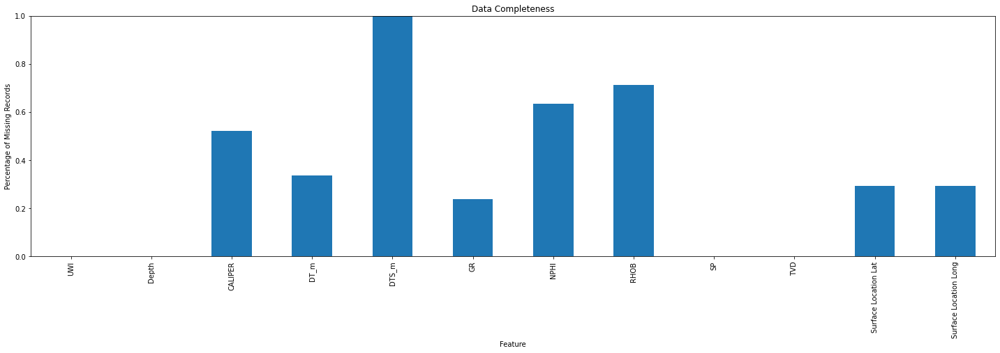

Number of records = 28806569.


In [7]:
(df_well.isnull().sum()/len(df_well)).plot(kind = 'bar')
plt.subplots_adjust(left=0.0, bottom=0.0, right=3.2, top=1.2, wspace=0.2, hspace=0.2) # plot formatting
plt.xlabel('Feature'); plt.ylabel('Percentage of Missing Records'); plt.title('Data Completeness')
plt.ylim([0,1.0])
plt.show()

print('Number of records = ' + str(len(df_well)) + '.')

#### Completeness Correlation

In [109]:
df_temp = df_well.copy(deep=True)                          # make a deep copy of the DataFrame
df_bool = df_temp.isnull()                                 # true is value, false if NaN
# for col in df_bool.columns:
#     df_bool[col] = np.where(df_bool[col],1,0)
df_bool.describe()

,UWI,Depth,CALIPER,DT_m,GR,NPHI,RHOB,SP,TVD,Surface Location Lat,Surface Location Long
count,2329653,2329653,2329653,2329653,2329653,2329653,2329653,2329653,2329653,2329653,2329653
unique,1,1,1,1,1,1,1,1,1,1,1
top,False,False,False,False,False,False,False,False,False,False,False
freq,2329653,2329653,2329653,2329653,2329653,2329653,2329653,2329653,2329653,2329653,2329653


In [106]:
df_bool

,UWI,Depth,CALIPER,DT_m,GR,NPHI,RHOB,SP,TVD,Surface Location Lat,Surface Location Long
352347,0,0,0,0,0,0,0,0,0,0,0
352348,0,0,0,0,0,0,0,0,0,0,0
352349,0,0,0,0,0,0,0,0,0,0,0
352350,0,0,0,0,0,0,0,0,0,0,0
352351,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
24006501,0,0,0,0,0,0,0,0,0,0,0
24006502,0,0,0,0,0,0,0,0,0,0,0
24006503,0,0,0,0,0,0,0,0,0,0,0
24006504,0,0,0,0,0,0,0,0,0,0,0


In [104]:
np.where(df_bool,1,0)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

#### Drop Features with Above Maximum Proportion Missing

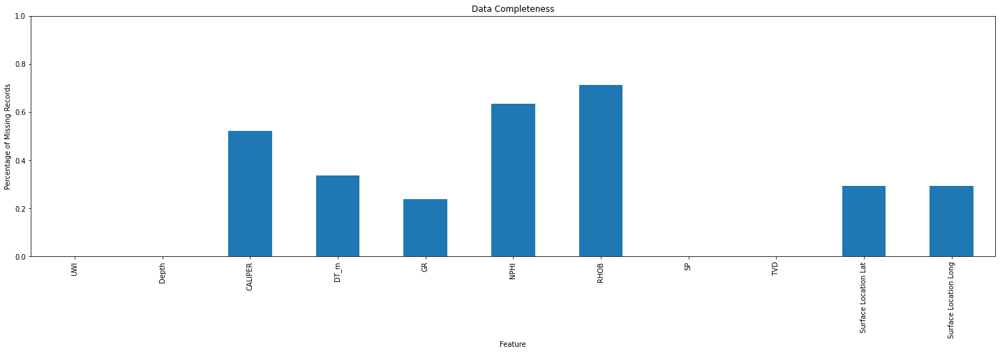

Number of records = 28806569.


In [8]:
max_prop_missing = 0.20 
min_count =  int(max_prop_missing*df_well.shape[0] + 1)
df_well = df_well.dropna(axis=1,thresh=min_count)

(df_well.isnull().sum()/len(df_well)).plot(kind = 'bar')
plt.subplots_adjust(left=0.0, bottom=0.0, right=3.2, top=1.2, wspace=0.2, hspace=0.2) # plot formatting
plt.xlabel('Feature'); plt.ylabel('Percentage of Missing Records'); plt.title('Data Completeness')
plt.ylim([0,1.0])
plt.show()

print('Number of records = ' + str(len(df_well)) + '.')

#### Drop All Samples Missing Any Feature - Likewise Deletion

Number of records = 2329653.


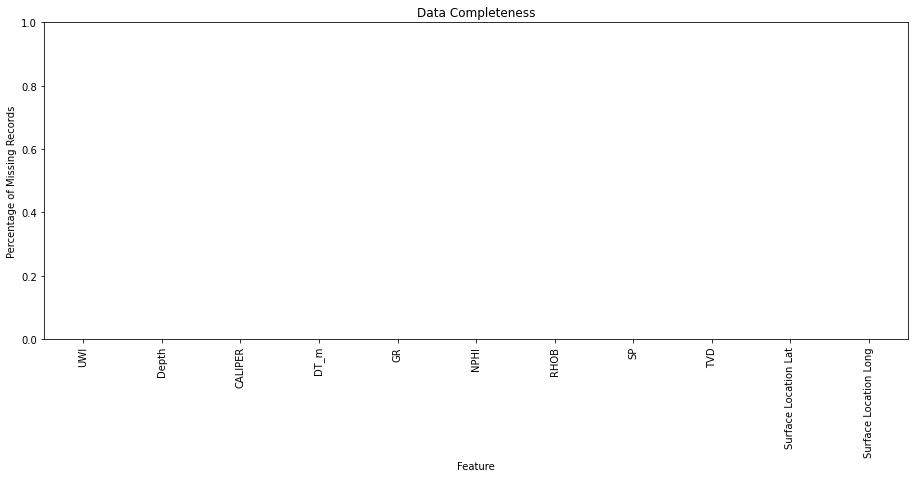

In [9]:
df_well.dropna(axis=0,how='any',subset = df_well.columns[1:], inplace=True)
(df_well.isnull().sum()/len(df_well)).plot(kind = 'bar')
plt.subplots_adjust(left=0.0, bottom=0.0, right=3.2, top=1.2, wspace=0.2, hspace=0.2) # plot formatting
plt.xlabel('Feature'); plt.ylabel('Percentage of Missing Records'); plt.title('Data Completeness')
plt.ylim([0,1.0])

print('Number of records = ' + str(len(df_well)) + '.')

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=1.1, wspace=0.2, hspace=0.2); plt.show()

#### Completeness Heat Maps

Impractical for number of samples

* could resample for display?

In [10]:
# df_temp = df_well.copy(deep=True)                          # make a deep copy of the DataFrame
# df_bool = df_temp.isnull()                            # true is value, false if NaN
# df_bool = df_bool.set_index(df_temp.pop('UWI'))       # set the index / feature for the heat map y column
# heat = sns.heatmap(df_bool, cmap=['r','w'], annot=False, fmt='.0f',cbar=False,linecolor='black',linewidth=0) # make the binary heat map, no bins
# heat.set_xticklabels(heat.get_xticklabels(), rotation=90, fontsize=8)
# heat.set_yticklabels(heat.get_yticklabels(), rotation=0, fontsize=8)
 
# heat.set_title('Data Completeness Heatmap',fontsize=16); heat.set_xlabel('Feature',fontsize=12); heat.set_ylabel('Well (UWI)',fontsize=12)

# plt.subplots_adjust(left=0.0, bottom=0.0, right=1.2, top=2.2, wspace=0.2, hspace=0.2); plt.show()

In [11]:
# cols = df_bool.iloc[:,5:].columns
# ncols = len(cols)

# df_corr = df_bool.corr()

# plt.subplot(121)
# im1 = plt.imshow(df_bool.iloc[:,5:].corr().values,interpolation = None, extent = [ncols,0,0,ncols], vmin = -1, vmax = 1,cmap = signif)
# cbar = plt.colorbar(im1, orientation="vertical", ticks=np.linspace(-1, 1, 11),fraction=0.046, pad=0.04)
# cbar.set_label('Pearson product-moment correlation coefficient', rotation=270, labelpad=20)
# plt.xticks(np.arange(ncols)+0.5, cols, color='black', rotation=45, fontsize='9', horizontalalignment='right')
# plt.yticks(np.arange(ncols)+0.5, cols, color='black', rotation=45, fontsize='9', horizontalalignment='right')
# plt.title("Correlation Coefficient of Missing Data Occurances")

# plt.subplots_adjust(left=0.0, bottom=0.0, right=3.0, top=3.1, wspace=0.2, hspace=0.2); plt.show()

In [12]:
#### Extract Information from Well Data

In [13]:
merge_features = ['UWI','BH X','BH Y']
df_data_extract = df_data[merge_features]
df = pd.merge(df_well,df_data_extract,on='UWI')
df.dropna(axis=0,how='any',inplace=True)
df.drop(["Depth","Surface Location Lat","Surface Location Long"],axis=1,inplace = True)
df = df.iloc[:,[0,8,9,7,2,3,4,5,6,1]]
df.rename({'BH X':'X','BH Y':'Y'},axis=1,inplace=True)
df.head()
print('Number of records = ' + str(len(df)) + '.')
df.describe()

Number of records = 1725533.


,UWI,X,Y,TVD,DT_m,GR,NPHI,RHOB,SP,CALIPER
count,1.725533e+06,1.725533e+06,1.725533e+06,1.725533e+06,1.725533e+06,1.725533e+06,1.725533e+06,1.725533e+06,1.725533e+06,1.725533e+06
mean,3.766041e+13,2.719350e+05,3.151274e+06,2.088618e+03,3.691645e+02,6.107912e+01,3.560319e+01,2.254727e+00,-5.466497e+01,1.335031e+01
std,1.003354e+13,1.268554e+05,9.247705e+04,6.864950e+02,5.980424e+01,1.833367e+01,1.248802e+01,1.346829e-01,3.279729e+01,4.007587e+00
min,1.770040e+13,1.071029e+05,2.974973e+06,2.537460e+02,0.000000e+00,-6.134101e-01,-3.665288e+00,9.680082e-01,-2.211709e+02,-8.789936e+00
25%,4.270240e+13,1.478341e+05,3.069722e+06,1.594406e+03,3.329683e+02,4.836897e+01,3.104141e+01,2.184380e+00,-6.763884e+01,1.071426e+01
50%,4.270440e+13,2.298074e+05,3.121784e+06,2.047799e+03,3.642409e+02,6.029334e+01,3.693765e+01,2.265383e+00,-4.970704e+01,1.311783e+01
75%,4.270840e+13,3.914345e+05,3.244302e+06,2.592010e+03,3.971016e+02,7.210696e+01,4.297314e+01,2.339571e+00,-3.738774e+01,1.555624e+01
max,4.271540e+13,4.839247e+05,3.283170e+06,3.519995e+03,8.996289e+02,1.869630e+02,1.212907e+02,2.999405e+00,1.682871e+02,2.655511e+01


In [14]:
#myproj = Proj("+proj=utm +zone=13T, +south +ellps=WGS84 +units=m +no_defs") # instantiate projection

#### Define Features

In [15]:
xmin = 80000; xmax = 500000
ymin = 3000000; ymax = 3300000
dmin = 250.0; dmax = 3600.0
depths = np.linspace(dmin,dmax,1000)

icols_loc = np.r_[1,2,3]; floc = df.columns[icols_loc].to_list()
icols_f = np.r_[4:10]; f = df.columns[icols_f].to_list()

print('Location features = ' + str(floc) + '.')
print('Features = ' + str(f) + '.')

lmin = [xmin,ymin,dmin]; lmax = [xmax,ymax,dmax]; lunit = ['meters','meters','meters']
print('X extent = ' + str(lmax[0]-lmin[0]) + ', Y extent = ' + str(lmax[1]-lmin[1]) + ', Depth extent = ' + str(lmax[2]-lmin[2]))
print('X:Y Extent Ratio = ' + str( (lmax[0]-lmin[0])/(lmax[1]-lmin[1]) ) + '.')

fmin = [0.0,0.0,-40,0.9,-230.0,-10.0] 
fmax = [1000.0,175.0,140,3.0,100.0,30.0]
funit = ['ms/ft','API','%','API','mV','inches']
fname = ['Sonic','Gamma Ray','Neutron Porosity','Density','Spontaneous Potential','Caliper']

f5 = df[f].quantile(0.05).values; f95 = df[f].quantile(0.95).values;

icols = np.append(icols_loc,icols_f)
cols = df.columns[icols].to_list()

print('All features = ' + str(cols))
cmin = lmin + fmin; cmax = lmax + fmax

Location features = ['X', 'Y', 'TVD'].
Features = ['DT_m', 'GR', 'NPHI', 'RHOB', 'SP', 'CALIPER'].
X extent = 420000, Y extent = 300000, Depth extent = 3350.0
X:Y Extent Ratio = 1.4.
All features = ['X', 'Y', 'TVD', 'DT_m', 'GR', 'NPHI', 'RHOB', 'SP', 'CALIPER']


#### Define Areal Map

In [16]:
nx = 144; ny = 60

xsiz = (xmax-xmin)/nx; ysiz = (ymax-ymin)/ny
xmn = xmin + xsiz*0.5; ymn = ymin + ysiz*0.5

xx, yy = np.meshgrid(np.arange(xmn, xmax, xsiz), np.arange(ymax-ysiz*0.5, ymin, -1 * ysiz))

print('nx: ' + str(nx) + ' , xmn: ' + str(xmn) + ' , xsiz: ' + str(xsiz))
print('ny: ' + str(ny) + ' , ymn: ' + str(ymn) + ' , ysiz: ' + str(ysiz))
print('Total number of cells: ' + str(nx*ny))

print('extents x: ' + str(xmin) + ' - ' + str(xmax) + ' = ' + str(xmax-xmin) + ', extents y: ' + str(ymin) + ' - ' + str(ymax) + ' = ' + str(ymax-ymin))

nx: 144 , xmn: 81458.33333333333 , xsiz: 2916.6666666666665
ny: 60 , ymn: 3002500.0 , ysiz: 5000.0
Total number of cells: 8640
extents x: 80000 - 500000 = 420000, extents y: 3000000 - 3300000 = 300000


#### Location Maps

* slow runtime, commented out

In [17]:
# nbins = 50

# print('Working on well data visualization: ', end='')
# for i, feature in enumerate(floc):
#     print(str(i+1) + ', ', end='')    
#     plt.subplot(len(floc),2,2*i+1)
#     sc1 = plt.scatter(df['X'],df['Y'],vmin = lmin[i], vmax = lmax[i], c = df[floc[i]],cmap = plt.cm.inferno,s=30,alpha=0.9,edgecolor='black',lw=0.005)
#     plt.xlim([xmin,xmax]); plt.ylim([ymin,ymax])
#     cbar = plt.colorbar(sc1, orientation="vertical", ticks=np.linspace(lmin[i],lmax[i], 21),fraction=0.046, pad=0.04)
#     cbar.set_label(floc[i] + '(' + lunit[i] + ')', rotation=270, labelpad=20)
#     plt.title('Well Data Locations - ' + floc[i])
#     plt.grid(True)

# for i, feature in enumerate(floc):
#     plt.subplot(len(floc),2,2*i+2)
#     hist = plt.hist(x=df[floc[i]],weights=None,bins=np.linspace(lmin[i],lmax[i],nbins),alpha = 0.6,edgecolor='black',color='darkorange')
#     plt.xlabel(floc[i] + ' ('+ lunit[i] + ')'); 
#     plt.ylabel('Frequency'); 
#     plt.title(floc[i]) # axes labels
#     plt.xlim(lmin[i],lmax[i]); plt.ylim([0,int(max(hist[0]))*1.1])                      # constrain the axes' extents                           

# plt.subplots_adjust(left=0.0, bottom=0.0, right=2., top=3.1, wspace=0.4, hspace=0.3); plt.show()

#### Well Features - Locations and Distributions

In [18]:
# nbins = 30

# print('Working on well locations visualization: ', end='')
# for i, feature in enumerate(f):
#     print(str(i+1) + ', ', end='')    
#     plt.subplot(len(f),2,2*i+1)
#     sc1 = plt.scatter(df['X'],df['Y'],vmin = f5[i], vmax = f95[i], c = df[f[i]],cmap = plt.cm.inferno,s=30,alpha=0.9,edgecolor='black',lw=0.005)
#     plt.xlim([xmin,xmax]); plt.ylim([ymin,ymax])
#     cbar = plt.colorbar(sc1, orientation="vertical", ticks=np.linspace(f5[i],f95[i], 21),fraction=0.046, pad=0.04)
#     cbar.set_label(f[i] + '(' + funit[i] + ')', rotation=270, labelpad=20)
#     plt.title('Well Data Locations - ' + f[i])
#     plt.grid(True)

# print('\nWorking on well distributions visualization: ', end='')
# for i, feature in enumerate(f):
#     print(str(i+1) + ', ', end='')   
#     plt.subplot(len(f),2,2*i+2)
#     hist = plt.hist(x=df[f[i]],weights=None,bins=np.linspace(fmin[i],fmax[i],nbins),alpha = 0.6,edgecolor='black',color='darkorange')
#     plt.xlabel(f[i] + ' ('+ funit[i] + ')'); 
#     plt.ylabel('Frequency'); 
#     plt.title(f[i]) # axes labels
#     plt.xlim(fmin[i],fmax[i]); plt.ylim([0,int(max(hist[0]))*1.1])                      # constrain the axes' extents                           

# plt.subplots_adjust(left=0.0, bottom=0.0, right=2., top=len(f)+0.1, wspace=0.4, hspace=0.3); plt.show()

#### Matrix Scatter Plot of Unfiltered Data

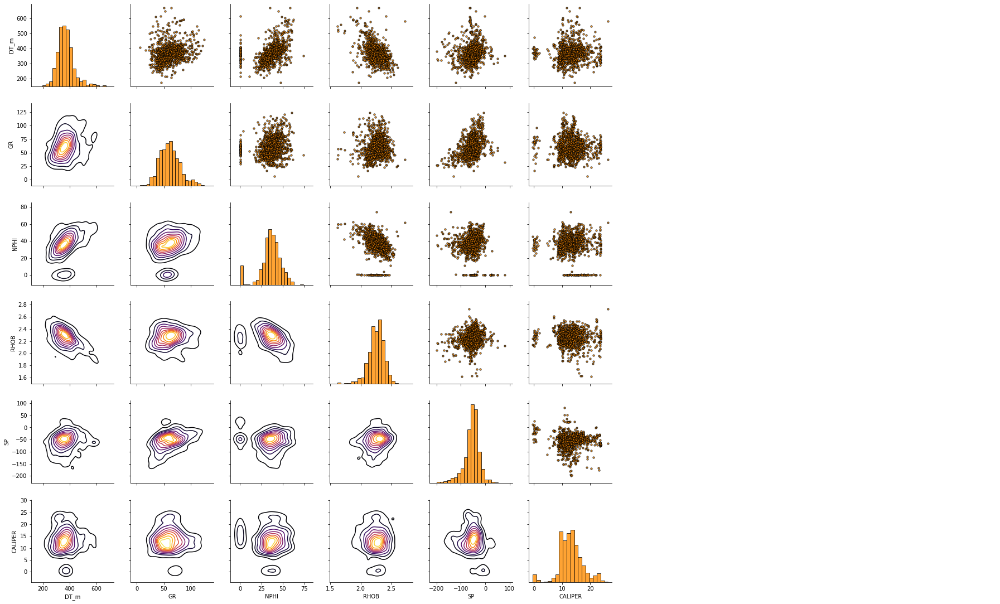

In [19]:
nsample0 = 1000
if nsample0 > 0:
    df_sample0 = df.sample(n=nsample0)
else: 
    df_sample0 = df

pairgrid = sns.PairGrid(df_sample0,vars=f, size = 4)
pairgrid = pairgrid.map_upper(plt.scatter, color = 'darkorange', edgecolor = 'black', alpha = 0.8, s = 10)
pairgrid = pairgrid.map_diag(plt.hist, bins = 20, color = 'darkorange',alpha = 0.8, edgecolor = 'k')# Map a density plot to the lower triangle
pairgrid = pairgrid.map_lower(sns.kdeplot, cmap = plt.cm.inferno, 
                              shade = False, shade_lowest = False, alpha = 1.0, n_levels = 10)
pairgrid.add_legend()
plt.subplots_adjust(left=0.0, bottom=0.0, right=0.6, top=0.6, wspace=0.2, hspace=0.2)

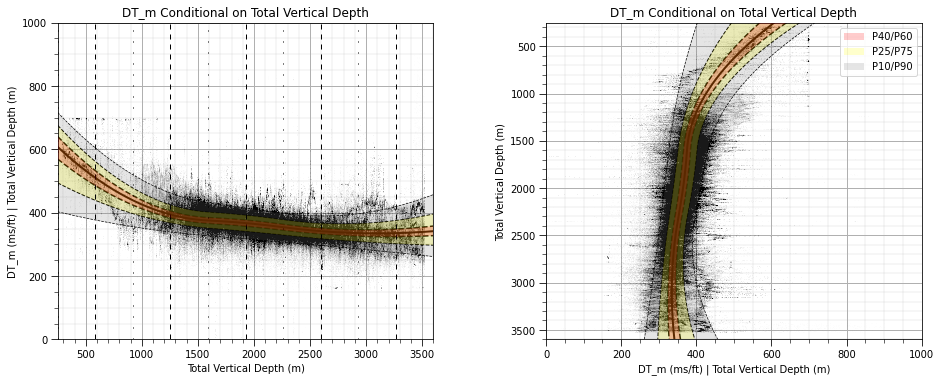

In [20]:
i=0
plt.subplot(121)
cond_prob_plot(df['TVD'].values,dmin,dmax,'Total Vertical Depth','m',5,
                                                     df[f[i]],fmin[i],fmax[i],f[i],funit[i])

plt.subplot(122)
cond_prob_plot_rot(df['TVD'].values,dmin,dmax,'Total Vertical Depth','m',5,
                                                     df[f[i]],fmin[i],fmax[i],f[i],funit[i])

plt.subplots_adjust(left=0.0, bottom=0.0, right=2., top=1.1, wspace=0.3, hspace=0.3)
plt.show()

#### Conditional Distributions / Depth Trend Plots


Working on conditional distribution plots: 1, 2, 3, 4, 5, 6, 

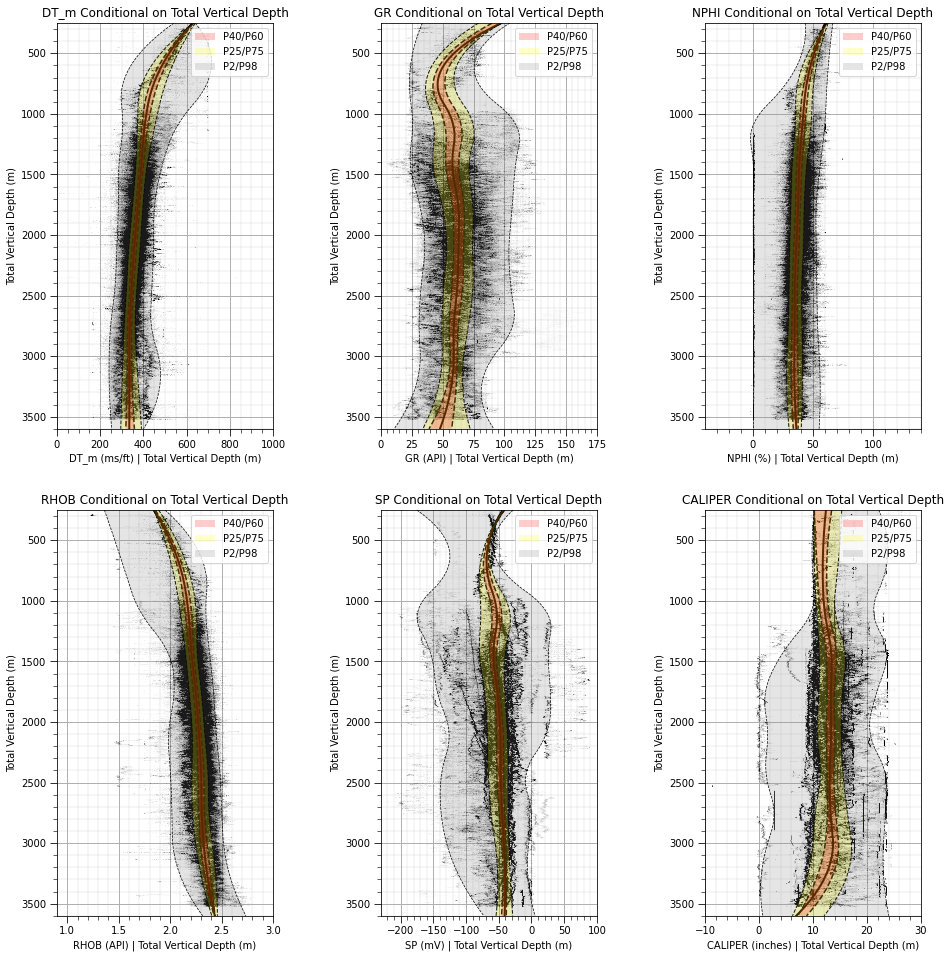

In [21]:
Well_P50splines = []; Well_P10splines = []; Well_P90splines = []

print('\nWorking on conditional distribution plots: ', end='')
for i, feature in enumerate(f):
    print(str(i+1) + ', ', end='')  
    plt.subplot(2,3,i+1)
    P50spline, P10spline, P90spline = cond_prob_plot_rot(df['TVD'].values,dmin,dmax,'Total Vertical Depth','m',10,
                                                     df[f[i]],fmin[i],fmax[i],f[i],funit[i],alpha=0.04)
    Well_P50splines.append(P50spline); Well_P10splines.append(P10spline); Well_P90splines.append(P90spline)

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=3.1, wspace=0.5, hspace=0.2)
plt.show()

#### Filter \#1 Remove Locations with Out of Range Caliper Values

Number of original records = 1725533.
Number of records after filter = 1578411 , Percentage retained = 91.5%


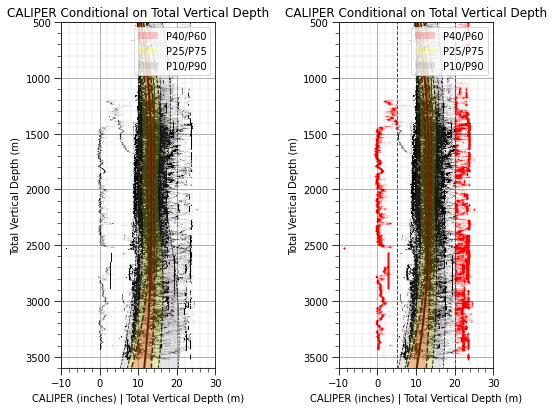

In [22]:
df['filter1'] = np.zeros(len(df))

min_cal = 5; max_cal = 20
df['filter1'] = np.where((df['CALIPER'] < min_cal) | (df['CALIPER'] > max_cal),1,0)

df_keep = df[df['filter1'] == 0]
df_remove = df[df['filter1'] == 1]

print('Number of original records = ' + str(len(df)) + '.')
print('Number of records after filter = ' + str(len(df_keep)) + ' , Percentage retained = ' + str(round(len(df_keep)/len(df),3)*100) + '%')

plt.subplot(121)
i = 5
P50spline, P10spline, P90spline = cond_prob_plot_rot(df['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df[f[i]],fmin[i],fmax[i],f[i],funit[i])

plt.subplot(122)
i = 5
P50spline, P10spline, P90spline = cond_prob_plot_rot(df_keep['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df_keep[f[i]],fmin[i],fmax[i],f[i],funit[i])
plt.scatter(df_remove[f[i]],df_remove['TVD'],color='red',s=1,alpha=0.01)
plt.vlines(min_cal,dmin,dmax,color='red',ls='--',lw=1); plt.vlines(max_cal,dmin,dmax,color='red',ls='--',lw=1)

plt.subplots_adjust(left=0.0, bottom=0.0, right=1.0, top=1.2, wspace=0.8, hspace=0.2); plt.show()

Now let's see where the filtered data are over all features.


Working on conditional distribution plots: 1, 2, 3, 4, 5, 6, 

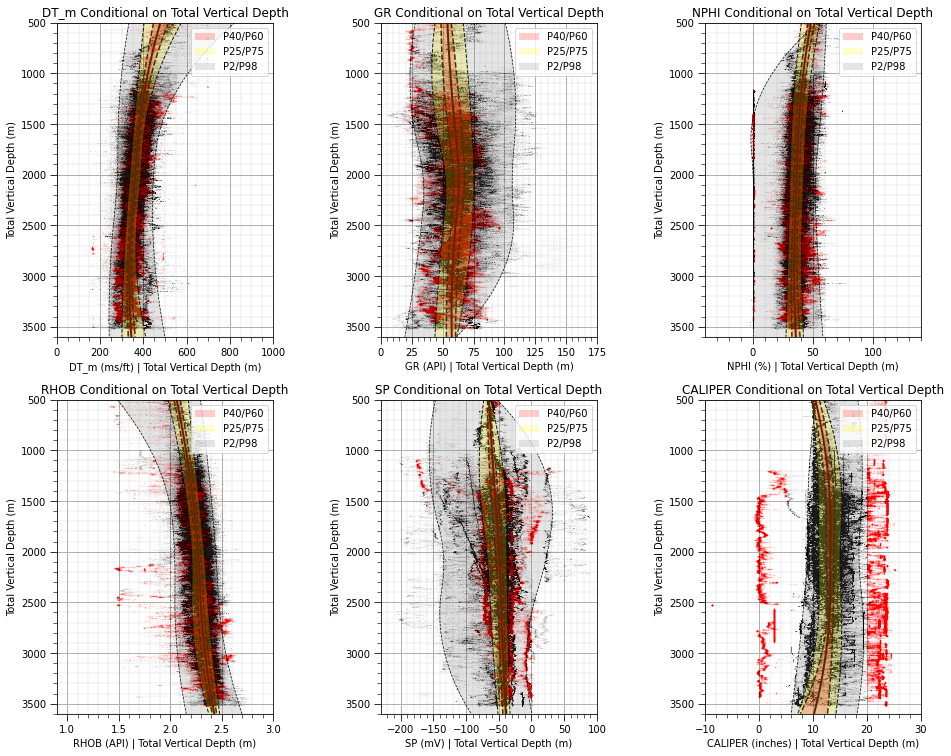

In [23]:
Well_P50splines = []; Well_P10splines = []; Well_P90splines = []

print('\nWorking on conditional distribution plots: ', end='')
for i, feature in enumerate(f):
    print(str(i+1) + ', ', end='')  
    plt.subplot(2,3,i+1)
    P50spline, P10spline, P90spline = cond_prob_plot_rot(df_keep['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df_keep[f[i]],fmin[i],fmax[i],f[i],funit[i],alpha=0.04)
    plt.scatter(df_remove[f[i]],df_remove['TVD'],color='red',s=1,alpha=0.01)
    Well_P50splines.append(P50spline); Well_P10splines.append(P10spline); Well_P90splines.append(P90spline)

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=2.4, wspace=0.5, hspace=0.2)
plt.show()

Now let's look at the density of the filtered data values.


Working on conditional distribution plots: 1, 2, 3, 4, 5, 6, 

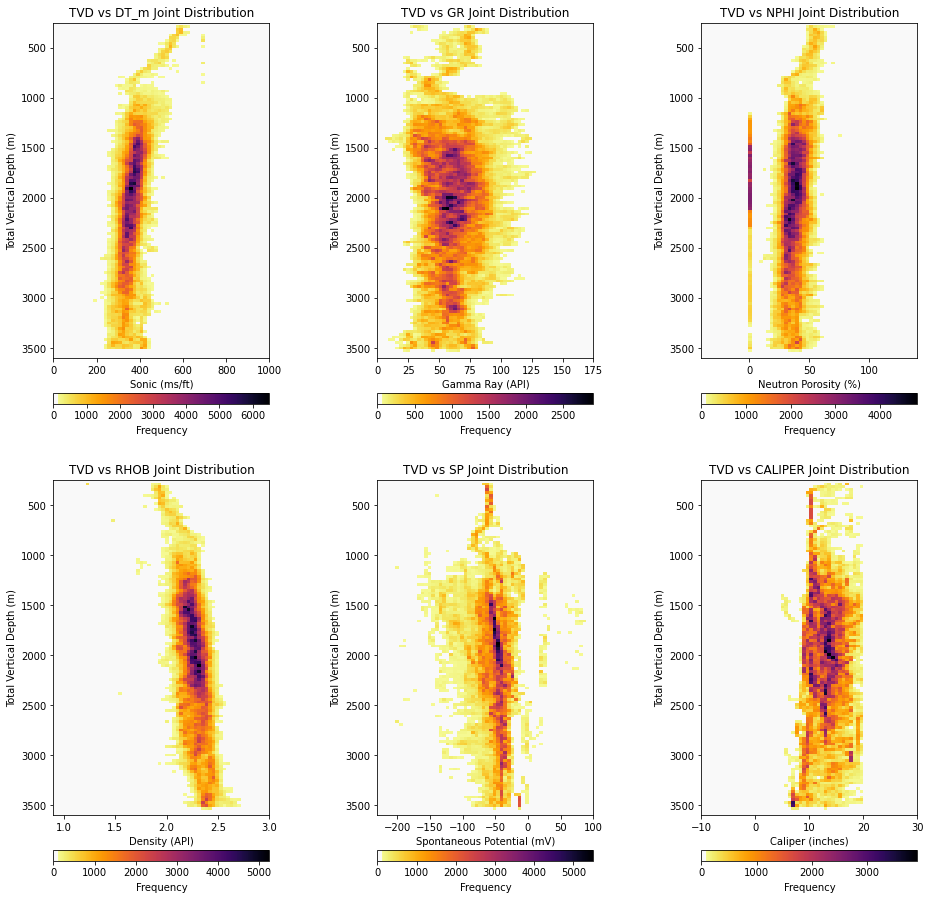

In [24]:
nbins = 60

print('\nWorking on conditional distribution plots: ', end='')
for i, feature in enumerate(f):
    print(str(i+1) + ', ', end='')  
    plt.subplot(2,3,i+1)
    joint_plot(df_keep,f[i],fmin[i],fmax[i],fname[i],funit[i],'TVD',dmin,dmax,'Total Vertical Depth','m',nbins) 

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=3.1, wspace=0.5, hspace=0.05)
plt.show()

Let's Visualize the Proportion Removed from a Feature Depth Trend

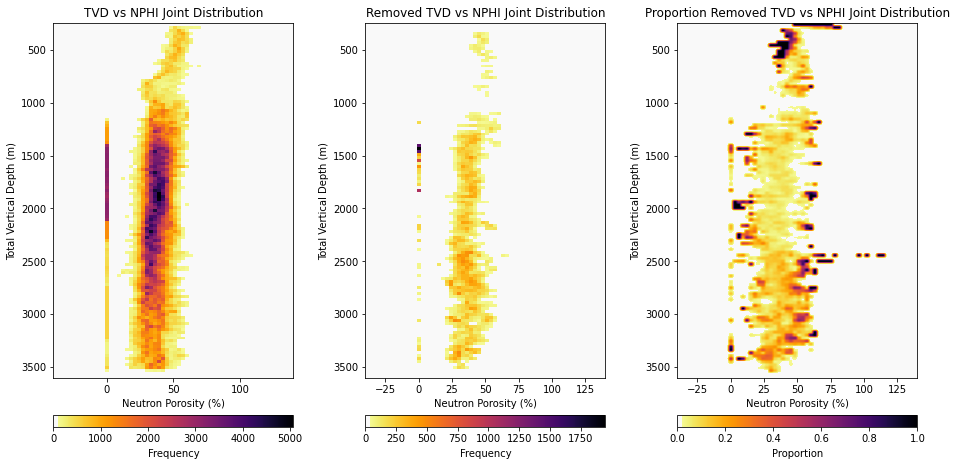

In [25]:
nbins = 60; i = 2
joint_delta_plot(df,df_remove,f[i],fmin[i],fmax[i],fname[i],funit[i],'TVD',dmin,dmax,'Total Vertical Depth','m',nbins) 

Now we check the matrix scatter plot of filtered and retained

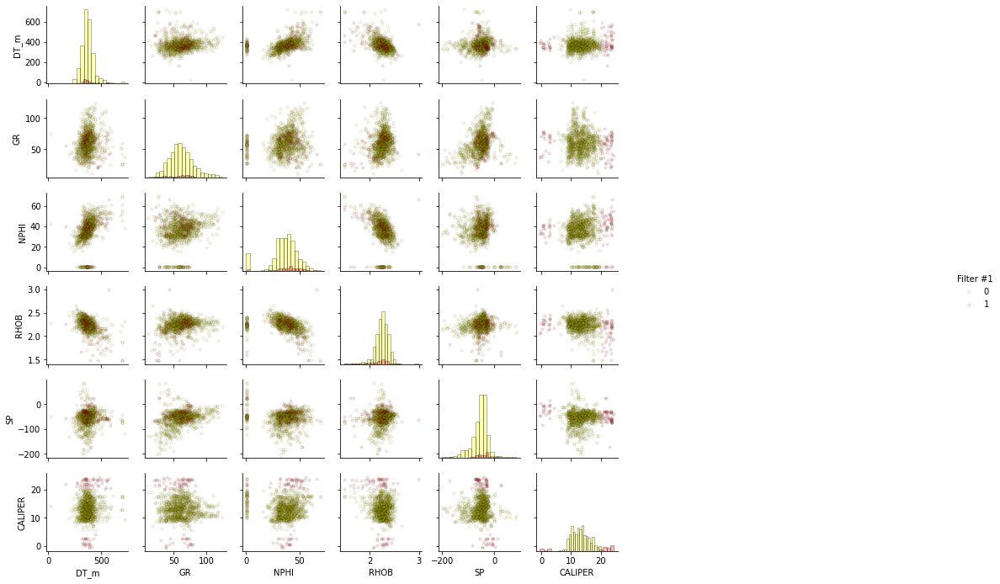

In [26]:
nsample1 = 1000
if nsample1 > 0:
    df_sample1 = df.sample(n=nsample1)
else: 
    df_sample1 = df

pairgrid = sns.PairGrid(df_sample1,vars = f,hue='filter1',palette = ['yellow','red'])
pairgrid = pairgrid.map_upper(plt.scatter,edgecolor = 'black', alpha = 0.1, s = 10)
pairgrid = pairgrid.map_lower(plt.scatter,edgecolor = 'black', alpha = 0.1, s = 10)
pairgrid = pairgrid.map_diag(plt.hist, bins = 20,alpha = 0.3, edgecolor = 'k')# Map a density plot to the lower triangle

pairgrid.add_legend(title = 'Filter #1')
plt.subplots_adjust(left=0.0, bottom=0.0, right=0.6, top=0.6, wspace=0.2, hspace=0.2)

#### Filter \#2 Identify Locations with Very Low Neutron Porosity

Number of original records = 1725533.
Number of records after filter = 1608567 , Percentage retained = 93.2%


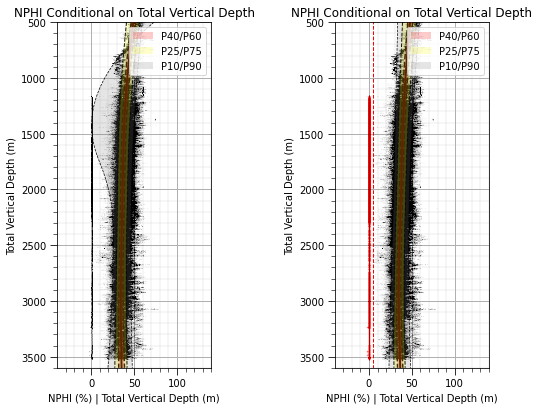

In [27]:
df['filter2'] = np.zeros(len(df))

min_NPHI = 1.0
df['filter2'] = np.where((df['NPHI'] < min_NPHI),1,0)
df['sfilter2'] = np.where((df['NPHI'] < min_NPHI),'filtered','retained')

df_keep2 = df[df['filter2'] == 0]
df_remove2 = df[df['filter2'] == 1]

print('Number of original records = ' + str(len(df)) + '.')
print('Number of records after filter = ' + str(len(df_keep2)) + ' , Percentage retained = ' + str(round(len(df_keep2)/len(df),3)*100) + '%')

plt.subplot(121)
i = 2
P50spline, P10spline, P90spline = cond_prob_plot_rot(df['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df[f[i]],fmin[i],fmax[i],f[i],funit[i])

plt.subplot(122)
i = 2
P50spline, P10spline, P90spline = cond_prob_plot_rot(df_keep2['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df_keep2[f[i]],fmin[i],fmax[i],f[i],funit[i])
plt.scatter(df_remove2[f[i]],df_remove2['TVD'],color='red',s=1,alpha=0.01)
plt.vlines(min_cal,dmin,dmax,color='red',ls='--',lw=1);

plt.subplots_adjust(left=0.0, bottom=0.0, right=1.0, top=1.2, wspace=0.8, hspace=0.2); plt.show()

Now let's see where the filtered data are over all features.


Working on conditional distribution plots: 1, 2, 3, 4, 5, 6, 

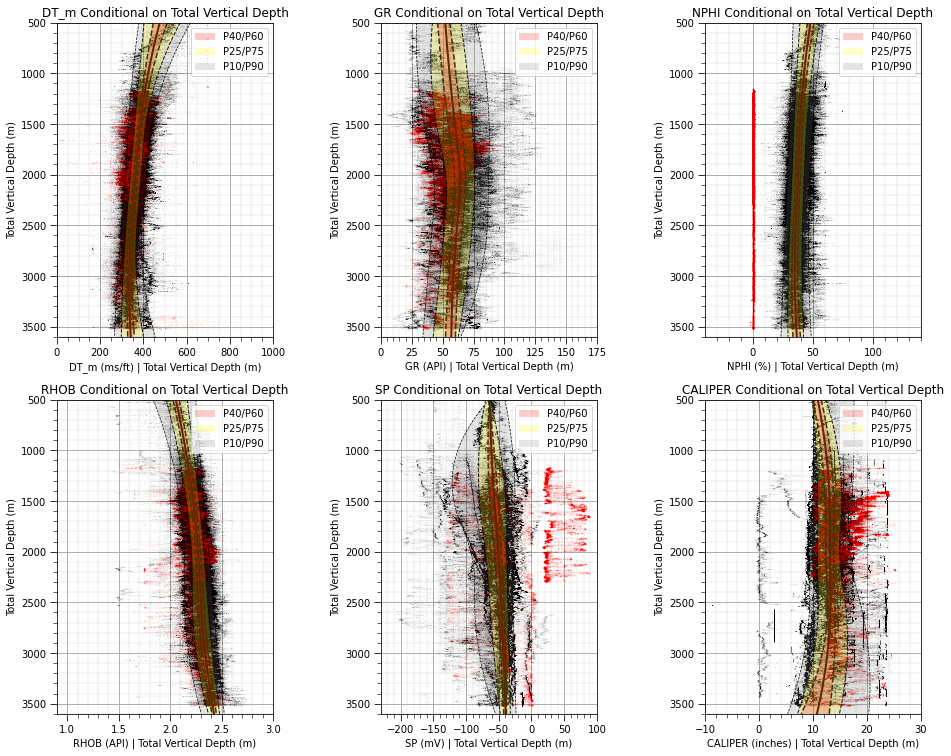

In [28]:
Well_P50splines2 = []; Well_P10splines2 = []; Well_P90splines2 = []

print('\nWorking on conditional distribution plots: ', end='')
for i, feature in enumerate(f):
    print(str(i+1) + ', ', end='')  
    plt.subplot(2,3,i+1)
    P50spline, P10spline, P90spline = cond_prob_plot_rot(df_keep2['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df_keep2[f[i]],fmin[i],fmax[i],f[i],funit[i])
    plt.scatter(df_remove2[f[i]],df_remove2['TVD'],color='red',s=1,alpha=0.01)
    Well_P50splines2.append(P50spline); Well_P10splines2.append(P10spline); Well_P90splines2.append(P90spline)

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=2.4, wspace=0.5, hspace=0.2)
plt.show()

Now let's look at the density of the filtered data values.


Working on conditional distribution plots: 1, 2, 3, 4, 5, 6, 

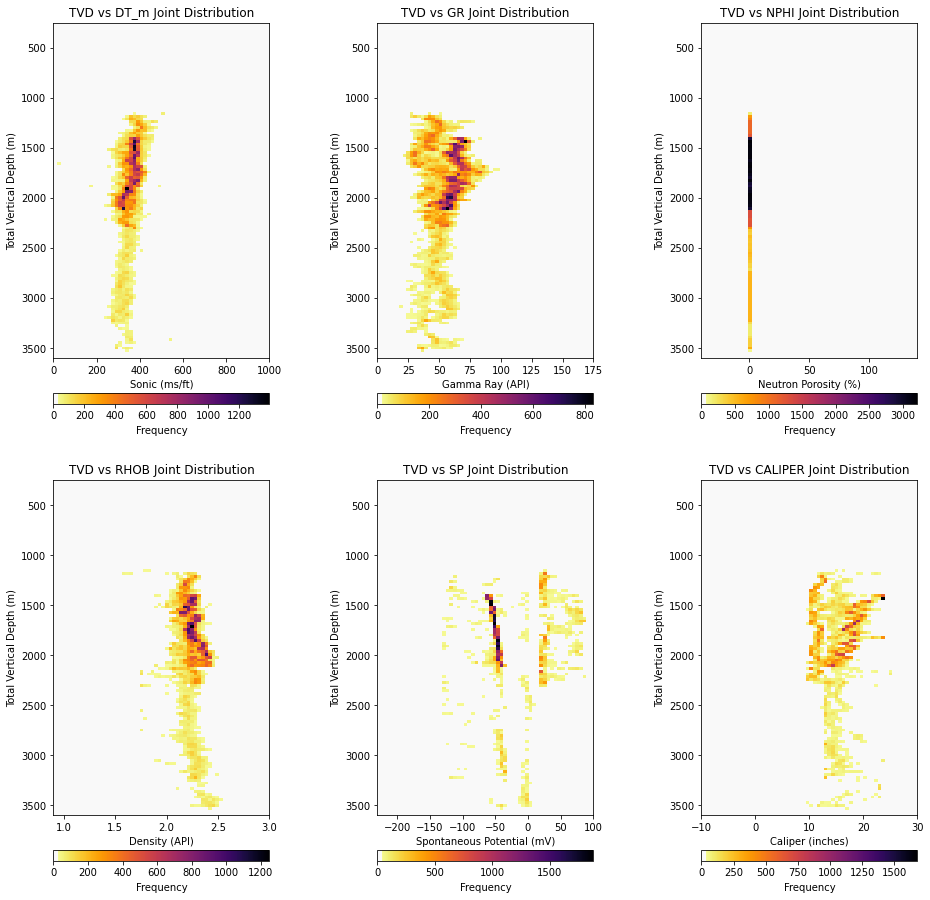

In [29]:
nbins = 60

print('\nWorking on conditional distribution plots: ', end='')
for i, feature in enumerate(f):
    print(str(i+1) + ', ', end='')  
    plt.subplot(2,3,i+1)
    joint_plot(df_remove2,f[i],fmin[i],fmax[i],fname[i],funit[i],'TVD',dmin,dmax,'Total Vertical Depth','m',nbins) 

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=3.1, wspace=0.5, hspace=0.05)
plt.show()

Let's Visualize the Proportion Removed from RHOB and SP Depth Trends

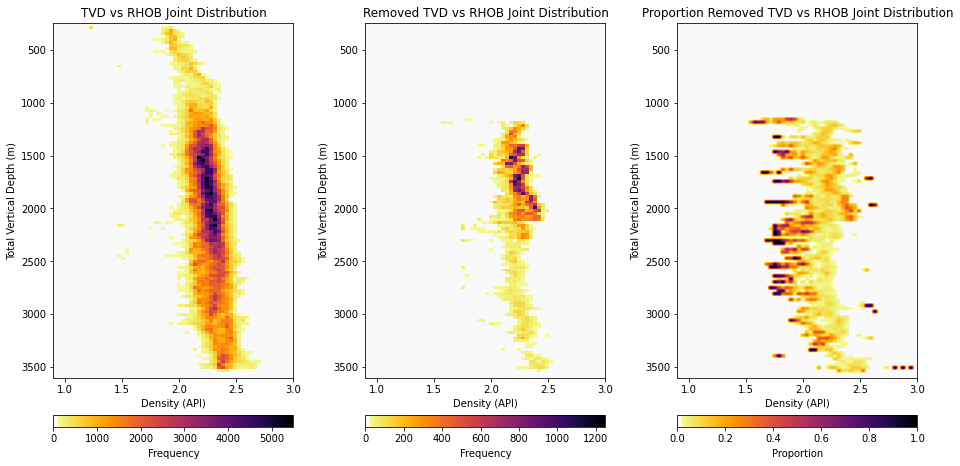

In [30]:
nbins = 60; i = 3
joint_delta_plot(df,df_remove2,f[i],fmin[i],fmax[i],fname[i],funit[i],'TVD',dmin,dmax,'Total Vertical Depth','m',nbins) 

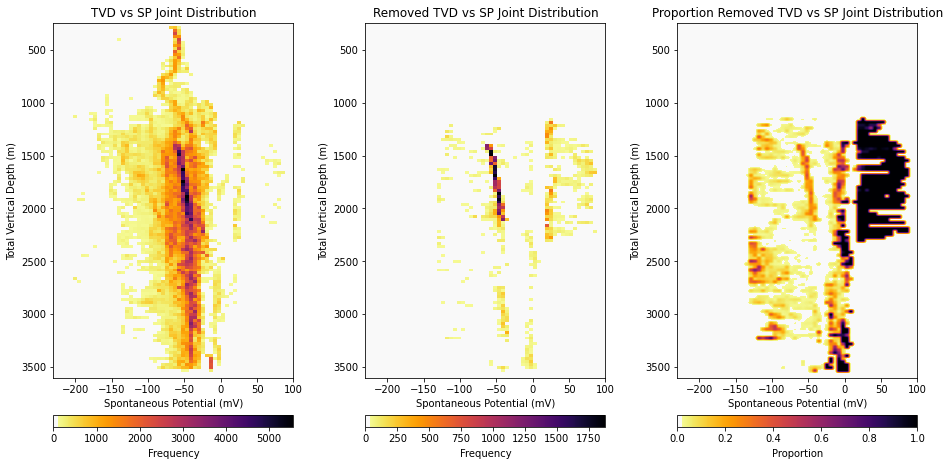

In [31]:
nbins = 60; i = 4
joint_delta_plot(df,df_remove2,f[i],fmin[i],fmax[i],fname[i],funit[i],'TVD',dmin,dmax,'Total Vertical Depth','m',nbins)

Now we check the matrix scatter plot of filtered and retained

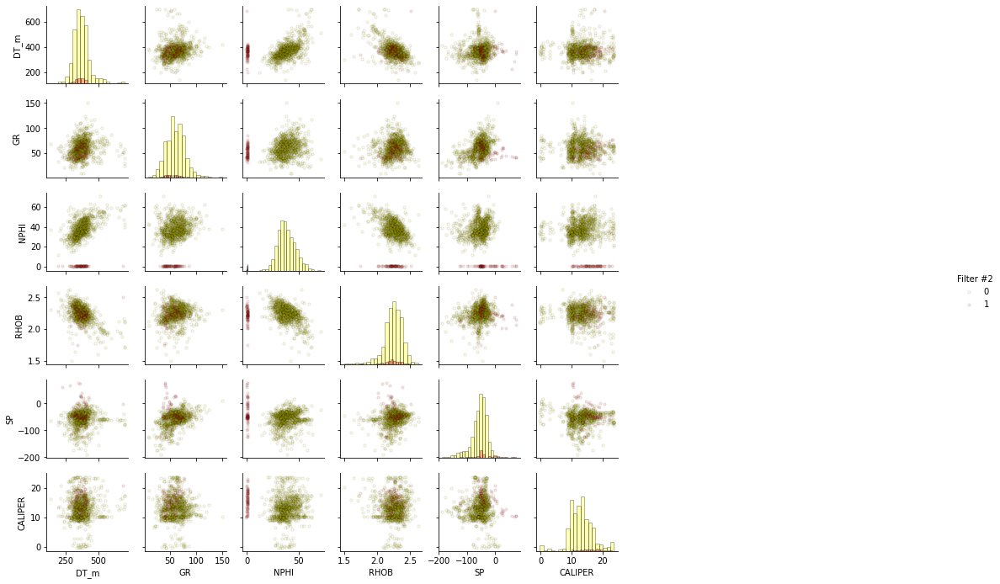

In [32]:
nsample2 = 1000
if nsample2 > 0:
    df_sample2 = df.sample(n=nsample2)
else: 
    df_sample2 = df

pairgrid = sns.PairGrid(df_sample2,vars = f,hue='filter2',palette = ['yellow','red'])
pairgrid = pairgrid.map_upper(plt.scatter,edgecolor = 'black', alpha = 0.1, s = 10)
pairgrid = pairgrid.map_lower(plt.scatter,edgecolor = 'black', alpha = 0.1, s = 10)
pairgrid = pairgrid.map_diag(plt.hist, bins = 20,alpha = 0.3, edgecolor = 'k')# Map a density plot to the lower triangle

pairgrid.add_legend(title = 'Filter #2')
plt.subplots_adjust(left=0.0, bottom=0.0, right=0.6, top=0.6, wspace=0.2, hspace=0.2)

#### Normalize \#1 Correct Neutron Porosity < 1.0

In [37]:
df['NPHI_original'] = df['NPHI']
df['NPHI_Norm'] = np.where(df['NPHI'].values < 1.0,df['NPHI'].values*100,df['NPHI'].values)

In [ ]:
#### Check NPHI Distributions

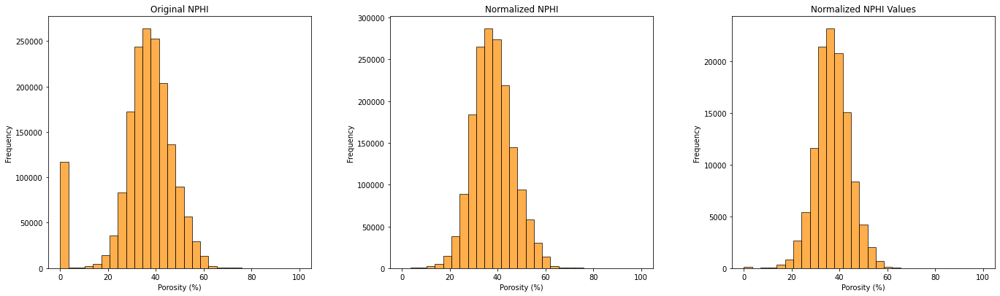

In [53]:
plt.subplot(131)
plt.hist(df['NPHI_original'].values,bins=np.linspace(0,100,30),color='darkorange',edgecolor='black',alpha=0.7)
plt.xlabel('Porosity (%)'); plt.ylabel('Frequency'); plt.title('Original NPHI')

plt.subplot(132)
plt.hist(df['NPHI_Norm'].values,bins=np.linspace(0,100,30),color='darkorange',edgecolor='black',alpha=0.7)
plt.xlabel('Porosity (%)'); plt.ylabel('Frequency'); plt.title('Normalized NPHI')

plt.subplot(133)
plt.hist(df.loc[df['sfilter2']=='filtered']['NPHI_Norm'].values,bins=np.linspace(0,100,30),color='darkorange',edgecolor='black',alpha=0.7)
plt.xlabel('Porosity (%)'); plt.ylabel('Frequency'); plt.title('Normalized NPHI Values')

plt.subplots_adjust(left=0.0, bottom=0.0, right=3.0, top=1.2, wspace=0.3, hspace=0.2); plt.show()

#### Adopt the Normalized NPHI for the Remainder of the Workflow

* don't use filter #2

In [54]:
df['NPHI'] = df['NPHI_Norm']

#### Filter \#3 Remove Depth Trend Outliers

Number of original records = 1725533.
Number of records after filter = 1655858 , Percentage retained = 96.0%


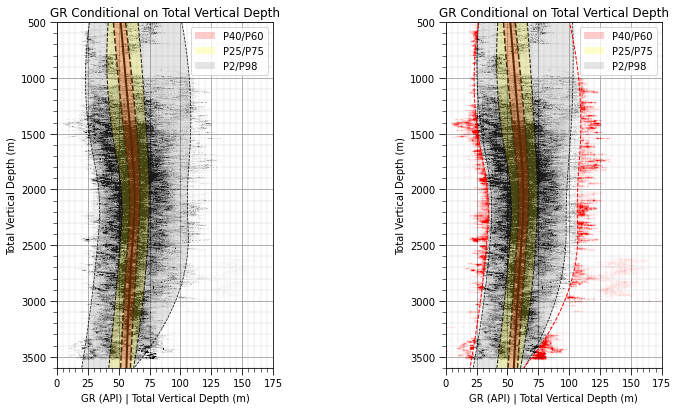

In [55]:
i = 1; alpha = 0.04

_, lower_spline, upper_spline = cond_prob_plot_rot(df_keep2['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df_keep2[f[i]],fmin[i],fmax[i],f[i],funit[i],alpha=alpha)

lower = lower_spline(df['TVD'].values); upper = upper_spline(df['TVD'].values)

df['filter3'] = np.where(np.logical_or(df[f[i]].values < lower.reshape((lower.shape[0])), 
                         df[f[i]].values > upper.reshape((upper.shape[0])) ),1,0)

df_keep3 = df[df['filter3'] == 0]
df_remove3 = df[df['filter3'] == 1]

print('Number of original records = ' + str(len(df)) + '.')
print('Number of records after filter = ' + str(len(df_keep3)) + ' , Percentage retained = ' + str(round(len(df_keep3)/len(df)*100,1)) + '%')

plt.subplot(121)
P50spline, P10spline, P90spline = cond_prob_plot_rot(df['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df[f[i]],fmin[i],fmax[i],f[i],funit[i],alpha)

plt.subplot(122)
P50spline, P10spline, P90spline = cond_prob_plot_rot(df_keep3['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df_keep3[f[i]],fmin[i],fmax[i],f[i],funit[i],alpha)
plt.scatter(df_remove3[f[i]],df_remove3['TVD'],color='red',s=1,alpha=0.01)
plt.plot(lower_spline(depths),depths,dmax,color='red',ls='--',lw=1); plt.plot(upper_spline(depths),depths,dmax,color='red',ls='--',lw=1)

plt.subplots_adjust(left=0.0, bottom=0.0, right=1.4, top=1.2, wspace=0.8, hspace=0.2); plt.show()

Now let's see where the filtered data are over all features.


Working on conditional distribution plots: 1, 2, 3, 4, 5, 6, 

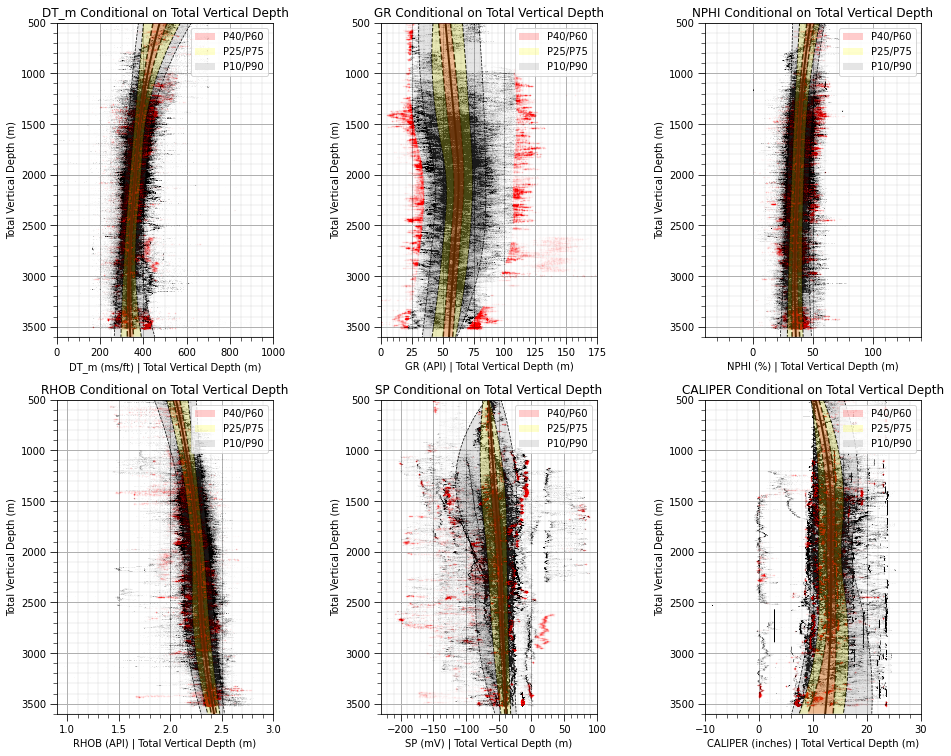

In [56]:
Well_P50splines3 = []; Well_P10splines3 = []; Well_P90splines3 = []

print('\nWorking on conditional distribution plots: ', end='')
for i, feature in enumerate(f):
    print(str(i+1) + ', ', end='')  
    plt.subplot(2,3,i+1)
    P50spline, P10spline, P90spline = cond_prob_plot_rot(df_keep3['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df_keep3[f[i]],fmin[i],fmax[i],f[i],funit[i])
    plt.scatter(df_remove3[f[i]],df_remove3['TVD'],color='red',s=1,alpha=0.01)
    Well_P50splines3.append(P50spline); Well_P10splines3.append(P10spline); Well_P90splines3.append(P90spline)

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=2.4, wspace=0.5, hspace=0.2)
plt.show()

Now let's look at the density of the filtered data values.


Working on conditional distribution plots: 1, 2, 3, 4, 5, 6, 

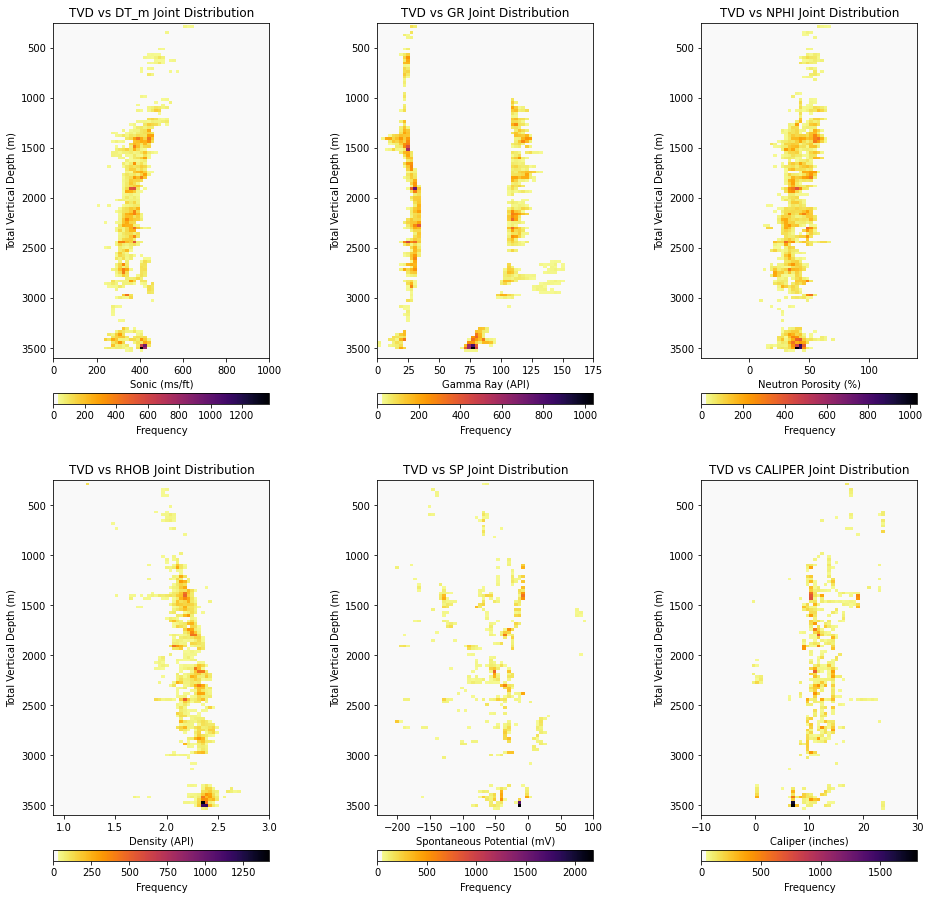

In [57]:
nbins = 60

print('\nWorking on conditional distribution plots: ', end='')
for i, feature in enumerate(f):
    print(str(i+1) + ', ', end='')  
    plt.subplot(2,3,i+1)
    joint_plot(df_remove3,f[i],fmin[i],fmax[i],fname[i],funit[i],'TVD',dmin,dmax,'Total Vertical Depth','m',nbins) 

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=3.1, wspace=0.5, hspace=0.05)
plt.show()

Let's visualize the proportion removed from NPHI Depth Trends

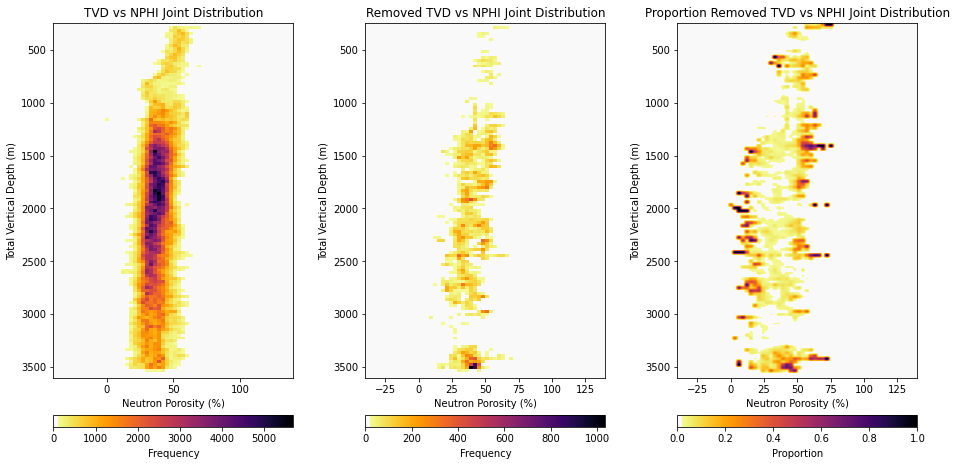

In [58]:
nbins = 60; i = 2
joint_delta_plot(df,df_remove3,f[i],fmin[i],fmax[i],fname[i],funit[i],'TVD',dmin,dmax,'Total Vertical Depth','m',nbins)

Now we check the matrix scatter plot of filtered and retained

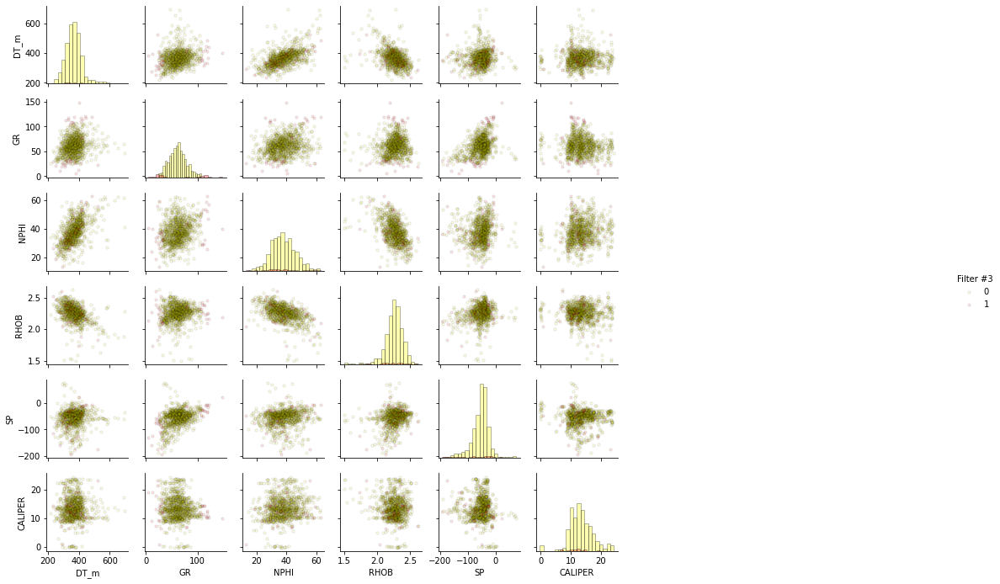

In [59]:
nsample3 = 1000
if nsample3 > 0:
    df_sample3 = df.sample(n=nsample3)
else: 
    df_sample3 = df

pairgrid = sns.PairGrid(df_sample3,vars = f,hue='filter3',palette = ['yellow','red'])
pairgrid = pairgrid.map_upper(plt.scatter,edgecolor = 'black', alpha = 0.1, s = 10)
pairgrid = pairgrid.map_lower(plt.scatter,edgecolor = 'black', alpha = 0.1, s = 10)
pairgrid = pairgrid.map_diag(plt.hist, bins = 20,alpha = 0.3, edgecolor = 'k')# Map a density plot to the lower triangle

pairgrid.add_legend(title = 'Filter #3')
plt.subplots_adjust(left=0.0, bottom=0.0, right=0.6, top=0.6, wspace=0.2, hspace=0.2)

#### Compile All FIlters

In [60]:
#df['filter_comp'] = np.where(np.logical_or( (df['filter1'] == 1),np.logical_or( (df['filter2'] == 1),(df['filter3'] == 1) ) ),1,0)  

#### Porosity Normalized, Not Using Filter 2 (Porosity < Lower Threshold)
df['filter_comp'] = np.where(np.logical_or( (df['filter1'] == 1),(df['filter3'] == 1) ),1,0)

df_keep_comp = df[df['filter_comp'] == 0]
df_remove_comp = df[df['filter_comp'] == 1]

# df_keep_comp = df[(df['filter1'] == 0) & (df['filter2'] == 0) & (df['filter3'] == 0)]
# df_remove_comp = df[(df['filter1'] == 1) | (df['filter2'] == 1) | (df['filter3'] == 1)]

print('Number of original records = ' + str(len(df)) + '.')
print('Number of records after filter = ' + str(len(df_keep_comp)) + ' , Percentage retained = ' + str(round(len(df_keep_comp)/len(df)*100,1)) + '%')

Number of original records = 1725533.
Number of records after filter = 1513191 , Percentage retained = 87.7%


Now let's see where the filtered data are over all features.


Working on conditional distribution plots: 1, 2, 3, 4, 5, 6, 

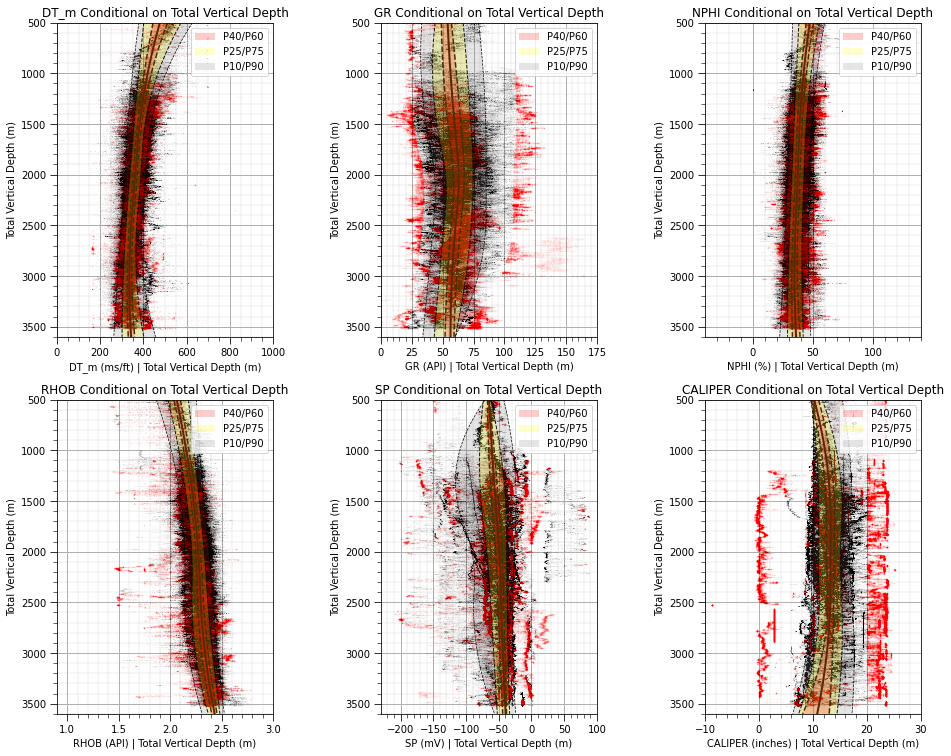

In [61]:
Well_P50splines_comp = []; Well_P10splines_comp = []; Well_P90splines_comp = []

print('\nWorking on conditional distribution plots: ', end='')
for i, feature in enumerate(f):
    print(str(i+1) + ', ', end='')  
    plt.subplot(2,3,i+1)
    P50spline, P10spline, P90spline = cond_prob_plot_rot(df_keep_comp['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df_keep_comp[f[i]],fmin[i],fmax[i],f[i],funit[i])
    plt.scatter(df_remove_comp[f[i]],df_remove_comp['TVD'],color='red',s=1,alpha=0.01)
    Well_P50splines_comp.append(P50spline); Well_P10splines_comp.append(P10spline); Well_P90splines_comp.append(P90spline)

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=2.4, wspace=0.5, hspace=0.2)
plt.show()

Now let's look at the density of the filtered data values.


Working on conditional distribution plots: 1, 2, 3, 4, 5, 6, 

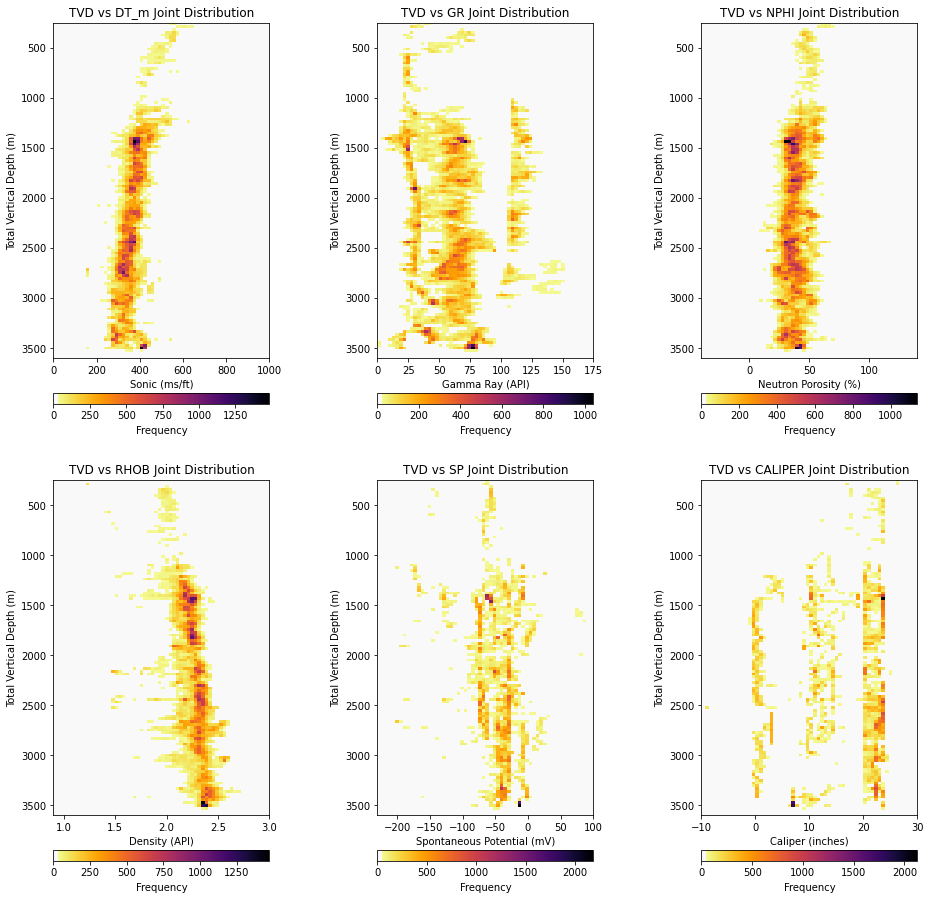

In [62]:
nbins = 60

print('\nWorking on conditional distribution plots: ', end='')
for i, feature in enumerate(f):
    print(str(i+1) + ', ', end='')  
    plt.subplot(2,3,i+1)
    joint_plot(df_remove_comp,f[i],fmin[i],fmax[i],fname[i],funit[i],'TVD',dmin,dmax,'Total Vertical Depth','m',nbins) 

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=3.1, wspace=0.5, hspace=0.05)
plt.show()

Let's look at the composite filter retained values and their conditional to depth distributions.


Working on conditional distribution plots: 1, 2, 3, 4, 5, 6, 

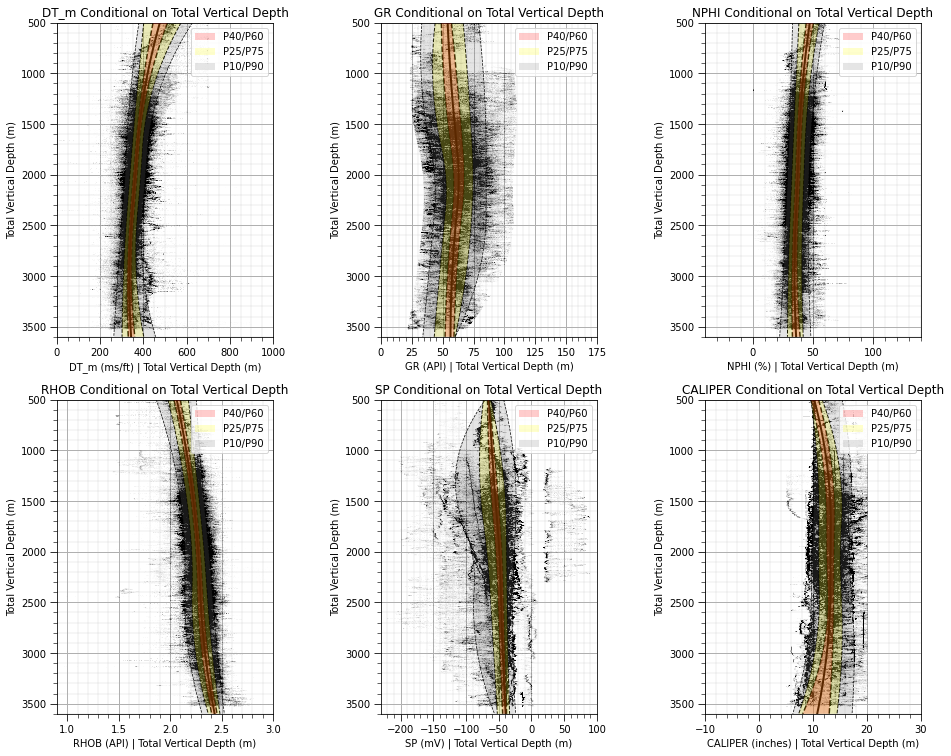

In [63]:
Well_P50splines_comp = []; Well_P10splines_comp = []; Well_P90splines_comp = []

print('\nWorking on conditional distribution plots: ', end='')
for i, feature in enumerate(f):
    print(str(i+1) + ', ', end='')  
    plt.subplot(2,3,i+1)
    P50spline, P10spline, P90spline = cond_prob_plot_rot(df_keep_comp['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df_keep_comp[f[i]],fmin[i],fmax[i],f[i],funit[i])
    Well_P50splines_comp.append(P50spline); Well_P10splines_comp.append(P10spline); Well_P90splines_comp.append(P90spline)

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=2.4, wspace=0.5, hspace=0.2)
plt.show()

Now let's look at the density of the filter composite retained data values.


Working on conditional distribution plots: 1, 2, 3, 4, 5, 6, 

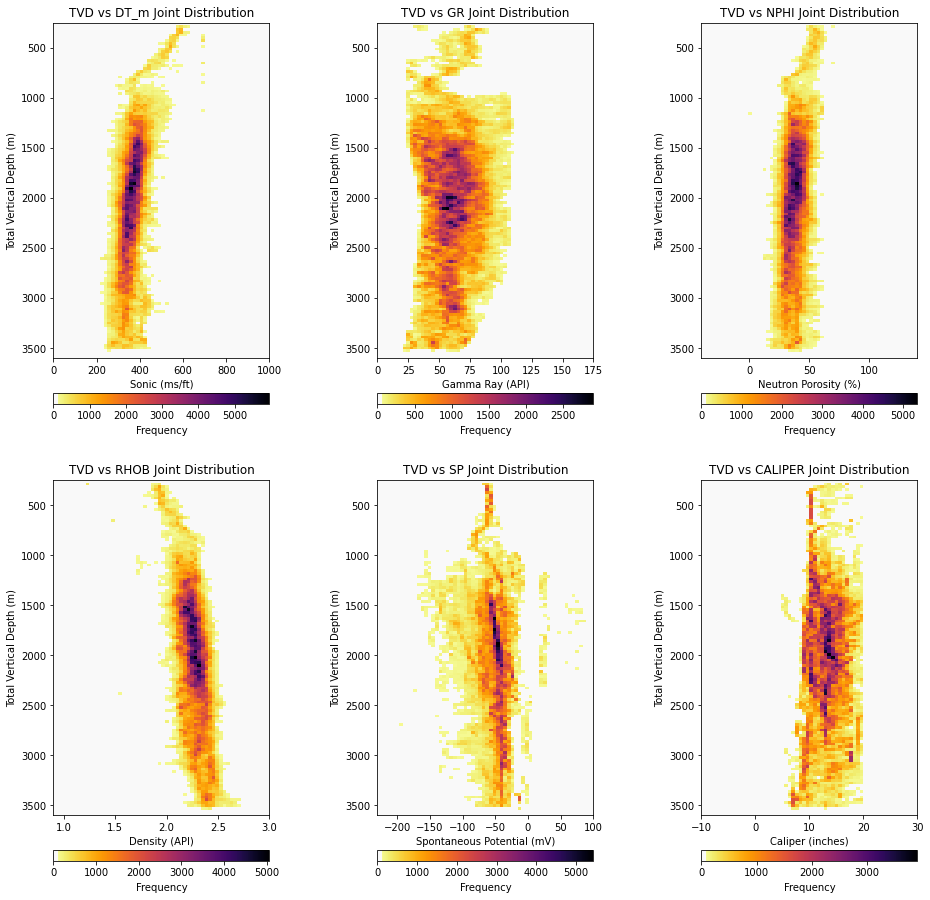

In [64]:
nbins = 60

print('\nWorking on conditional distribution plots: ', end='')
for i, feature in enumerate(f):
    print(str(i+1) + ', ', end='')  
    plt.subplot(2,3,i+1)
    joint_plot(df_keep_comp,f[i],fmin[i],fmax[i],fname[i],funit[i],'TVD',dmin,dmax,'Total Vertical Depth','m',nbins) 

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=3.1, wspace=0.5, hspace=0.05)
plt.show()

Let's visualize the proportion removed from all filters

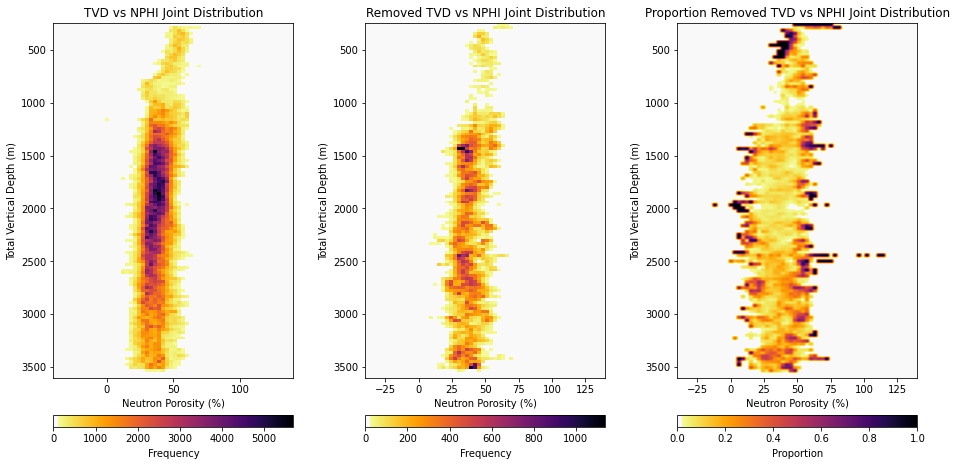

In [65]:
nbins = 60; i = 2
joint_delta_plot(df,df_remove_comp,f[i],fmin[i],fmax[i],fname[i],funit[i],'TVD',dmin,dmax,'Total Vertical Depth','m',nbins)

Now we check the matrix scatter plot of filtered and retained.

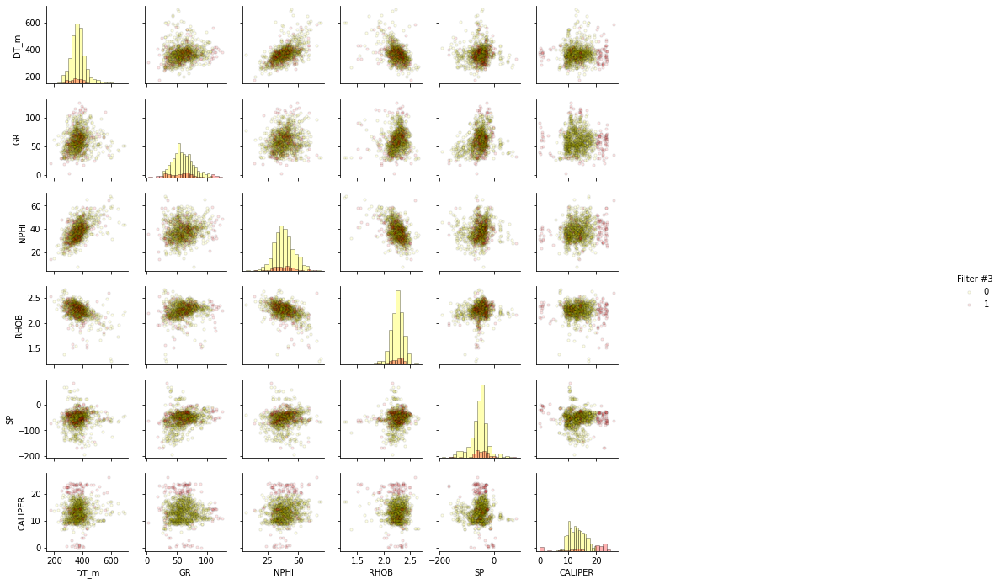

In [66]:
nsample_comp = 1000
if nsample_comp > 0:
    df_sample_comp = df.sample(n=nsample_comp)
else: 
    df_sample_comp = df

pairgrid = sns.PairGrid(df_sample_comp,vars = f,hue='filter_comp',palette = ['yellow','red'])
pairgrid = pairgrid.map_upper(plt.scatter,edgecolor = 'black', alpha = 0.1, s = 10)
pairgrid = pairgrid.map_lower(plt.scatter,edgecolor = 'black', alpha = 0.1, s = 10)
pairgrid = pairgrid.map_diag(plt.hist, bins = 20,alpha = 0.3, edgecolor = 'k')# Map a density plot to the lower triangle

pairgrid.add_legend(title = 'Filter #3')
plt.subplots_adjust(left=0.0, bottom=0.0, right=0.6, top=0.6, wspace=0.2, hspace=0.2)

#### Impute GR with SP

Evaluate the opportunity to impute missing GR with collocated SP data

* not sp response is nonstationary in depth / time and must be detrended first

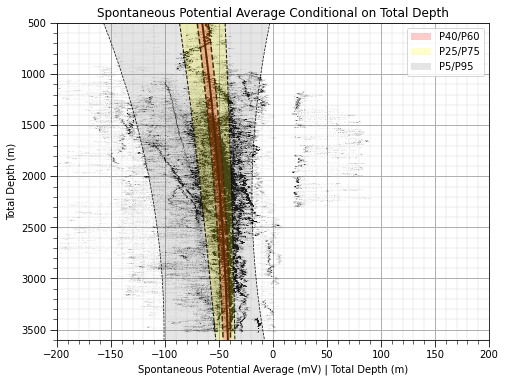

In [67]:
df_tempSP = df_keep_comp[['TVD','SP','GR']].copy(deep=True).dropna()

SP_depth_model,_,_ = cond_prob_plot_rot(df_tempSP['TVD'].values,500,dmax,'Total Depth','m',3,
                df_tempSP['SP'].values,-200,200,'Spontaneous Potential Average','mV',alpha=0.1)

plt.subplots_adjust(left=0.0, bottom=0.0, right=1.0, top=1.1, wspace=0.2, hspace=0.2); plt.show()

#### Apply and Check the SP Depth Trend Model

Calculate the SP depth trend residual and check it.

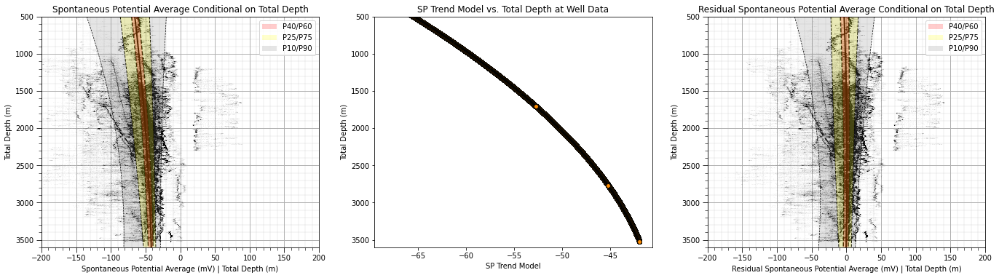

In [68]:
df_tempSP['SP_Depth_Trend'] = SP_depth_model(df_tempSP['TVD'].values)
df_tempSP['SP_Depth_Residual'] = df_tempSP['SP'] - df_tempSP['SP_Depth_Trend']
df_keep_comp['SP_Res'] = df_tempSP['SP_Depth_Residual']

plt.subplot(131)
SP_depth_model,_,_ = cond_prob_plot_rot(df_tempSP['TVD'].values,500,dmax,'Total Depth','m',3,
                df_tempSP['SP'].values,-200,200,'Spontaneous Potential Average','mV')

plt.subplot(132)
plt.scatter(df_tempSP['SP_Depth_Trend'],df_tempSP['TVD'],facecolor='darkorange',alpha=0.8,color='black')
plt.ylabel('Total Depth (m)'); plt.xlabel('SP Trend Model'); plt.title('SP Trend Model vs. Total Depth at Well Data')
plt.ylim([dmax,500])

plt.subplot(133)
SP_depth_model,_,_ = cond_prob_plot_rot(df_tempSP['TVD'].values,500,dmax,'Total Depth','m',3,
                df_tempSP['SP_Depth_Residual'].values,-200,200,'Residual Spontaneous Potential Average','mV')

plt.subplots_adjust(left=0.0, bottom=0.0, right=3.0, top=1.1, wspace=0.2, hspace=0.2); plt.show()

Use conditional probability plot to display the gamma ray from residual spontaneous potential relationship.

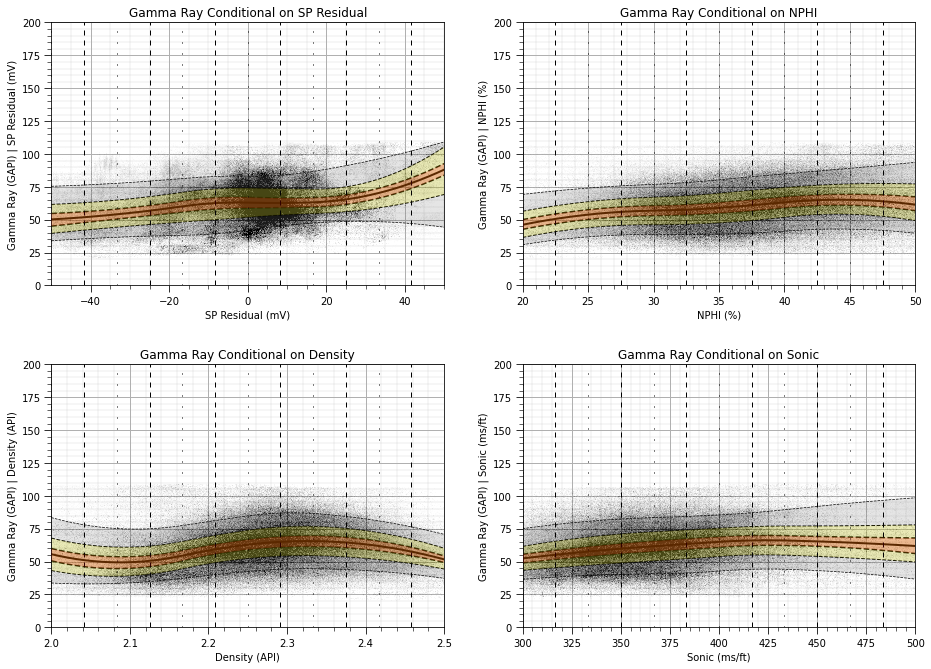

In [69]:
plt.subplot(221)
SP_depth_model,_,_ = cond_prob_plot(df_tempSP['SP_Depth_Residual'].values,-50,50,'SP Residual','mV',6,
                df_tempSP['GR'].values,0,200,'Gamma Ray','GAPI')

plt.subplot(222)
SP_depth_model,_,_ = cond_prob_plot(df_keep_comp['NPHI'].values,20,50,'NPHI','%',6,
                df_keep_comp['GR'].values,0,200,'Gamma Ray','GAPI')

plt.subplot(223)
SP_depth_model,_,_ = cond_prob_plot(df_keep_comp['RHOB'].values,2.0,2.5,'Density','API',6,
                df_keep_comp['GR'].values,0,200,'Gamma Ray','GAPI')

plt.subplot(224)
SP_depth_model,_,_ = cond_prob_plot(df_keep_comp['DT_m'].values,300.0,500.0,'Sonic','ms/ft',6,
                df_keep_comp['GR'].values,0,200,'Gamma Ray','GAPI')

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=2.1, wspace=0.2, hspace=0.3); plt.show()

#### Check Vsh Conditional Distributions

In [70]:
# sel_features = ['DT_m','NPHI','RHOB','SP_Res','GR']
# i = 1

# print('\nWorking on conditional distribution plots: ', end='')
# for j, feature in enumerate(sel_features):
#     print(str(j+1) + ', ', end='')  
#     plt.subplot(2,3,j+1)
#     _,_,_ = cond_prob_plot(df_keep_comp[sel_features[j]].values,fmin[j],fmax[j],f[j],funit[j],3,
#                                                      df_keep_comp[f[i]],fmin[i],fmax[i],f[i],funit[i])

#     print(fmin[i],fmax[i],f[i],funit[i])
    
# plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=2.4, wspace=0.5, hspace=0.2)
# plt.show()

#### Feature Selection

Due to the large number of data, we will randomly sample 10,000 data for practical feature selection

Let's start with the complete matrices to check all pairwise relationships


Working on 7 plots: 1, 2, 3, 4, 5, 6, 7, 

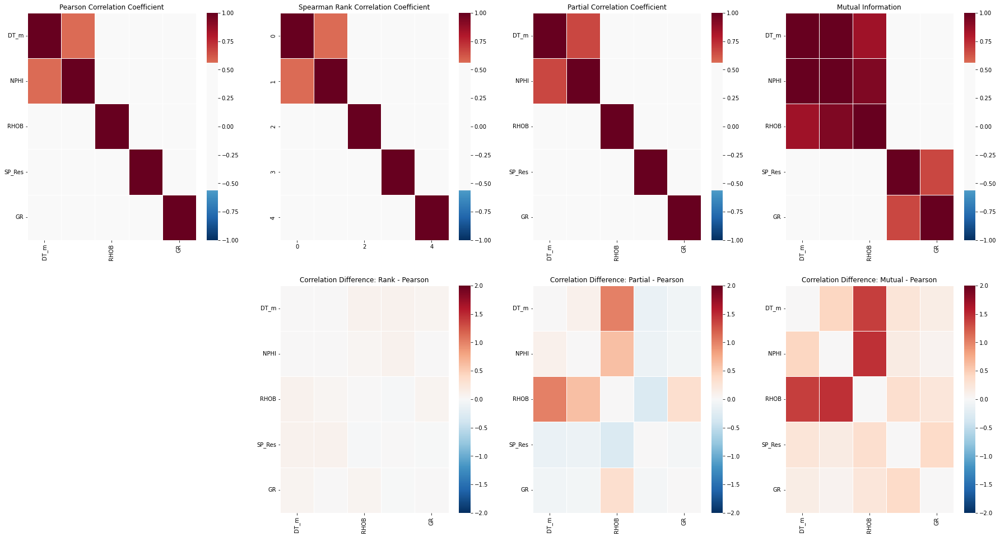

In [71]:
sel_features = ['DT_m','NPHI','RHOB','SP_Res','GR']

nsample = 10000
if nsample > 0:
    df_sample = df_keep_comp.sample(n=nsample)
else: 
    df_sample = df_keep_comp

print('\nWorking on 7 plots: ', end='')

plt.subplot(241)                          # plot a color coded correlation matrix
df_corr = df_sample[sel_features].corr()
sns.heatmap(df_corr,vmin = -1.0, vmax = 1.0,linewidths=.5, fmt= '.1f',cmap = signif)
plt.title('Pearson Correlation Coefficient'); print(str(1) + ', ', end='')

plt.subplot(242)                          # plot a color coded correlation matrix
df_rank_corr = stats.spearmanr(df_sample[sel_features])[0]
sns.heatmap(df_rank_corr,vmin = -1.0, vmax = 1.0,linewidths=.5, fmt= '.1f',cmap = signif)
plt.title('Spearman Rank Correlation Coefficient'); print(str(2) + ', ', end='')

plt.subplot(243)                          # plot a color coded correlation matrix
partial_correlation_temp = partial_corr(df_sample[sel_features]) # calculate the partial correlation coefficients
df_partial = pd.DataFrame(partial_correlation_temp,columns=sel_features,index=sel_features)
sns.heatmap(df_partial,vmin = -1.0, vmax = 1.0,linewidths=.5, fmt= '.1f',cmap = signif)
plt.title('Partial Correlation Coefficient'); print(str(3) + ', ', end='')

plt.subplot(244)
df_mutual = pd.DataFrame(mutual_matrix(df_sample[sel_features],sel_features),columns=sel_features,index=sel_features)
sns.heatmap(df_mutual,vmin = -1.0, vmax = 1.0,linewidths=.5, fmt= '.1f',cmap = signif)  
plt.title('Mutual Information'); print(str(4) + ', ', end='')

plt.subplot(246)
sns.heatmap(df_rank_corr-df_corr,vmin = -2.0, vmax = 2.0,linewidths=.5, fmt= '.1f',cmap = plt.cm.RdBu_r)  
plt.title('Correlation Difference: Rank - Pearson'); print(str(5) + ', ', end='')

plt.subplot(247)
sns.heatmap(df_partial-df_corr,vmin = -2.0, vmax = 2.0,linewidths=.5, fmt= '.1f',cmap = plt.cm.RdBu_r)  
plt.title('Correlation Difference: Partial - Pearson'); print(str(6) + ', ', end='')

plt.subplot(248)
plot = sns.heatmap(df_mutual-df_corr,vmin = -2.0, vmax = 2.0,linewidths=.5, fmt= '.1f',cmap = plt.cm.RdBu_r) 
plt.title('Correlation Difference: Mutual - Pearson'); print(str(7) + ', ', end='')

plt.subplots_adjust(left=0.0, bottom=0.0, right=4.0, top=3.1, wspace=0.2, hspace=0.2)
plt.show()

#### Feature Selection: Correlation and Mutual Information-based

Now let's look at the relationships with gamma ray

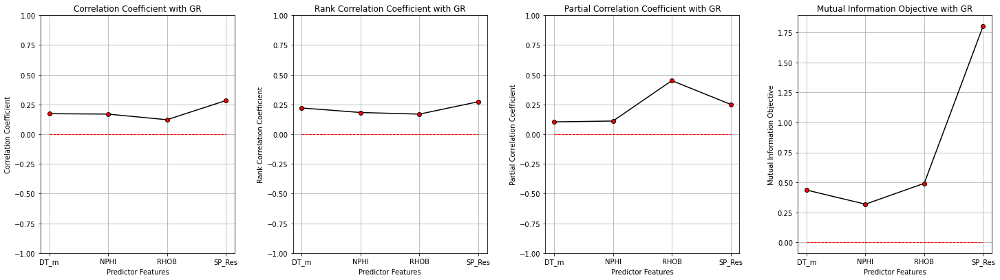

In [72]:
stand_correlation = df_sample.loc[:,sel_features].corr().iloc[len(sel_features)-1,:len(sel_features)-1]

stand_rank_correlation = stats.spearmanr(df_sample.loc[:,sel_features])[0][len(sel_features)-1][:-1]

stand_partial_correlation = partial_corr(df_sample.loc[:,sel_features])[len(sel_features)-1][:-1]

obj_mutual = mutual_information_objective(df_sample.loc[:,sel_features].iloc[:,:-1],df_sample.loc[:,sel_features].iloc[:,-1:])

plt.subplot(141)
plt.plot(sel_features[:-1],stand_correlation,color='black',zorder=1); plt.scatter(sel_features[:-1],stand_correlation,color='red',edgecolor='black',zorder=10)
plt.plot(np.full(len(sel_features)-1,0),'r--',linewidth = 1.0)
plt.xlabel('Predictor Features')
plt.ylabel('Correlation Coefficient')
t = plt.title('Correlation Coefficient with GR')
plt.ylim(-1,1)
plt.grid(True)

plt.subplot(142)
plt.plot(sel_features[:-1],stand_rank_correlation,color='black',zorder=1); plt.scatter(sel_features[:-1],stand_rank_correlation,color='red',edgecolor='black',zorder=10)
plt.plot(np.full(len(sel_features)-1,0),'r--',linewidth = 1.0)
plt.xlabel('Predictor Features')
plt.ylabel('Rank Correlation Coefficient')
t = plt.title('Rank Correlation Coefficient with GR')
plt.ylim(-1,1)
plt.grid(True)

plt.subplot(143)
plt.plot(sel_features[:-1],stand_partial_correlation,color='black',zorder=1); plt.scatter(sel_features[:-1],stand_partial_correlation,color='red',edgecolor='black',zorder=10)
plt.plot(np.full(len(sel_features)-1,0),'r--',linewidth = 1.0)
plt.xlabel('Predictor Features')
plt.ylabel('Partial Correlation Coefficient')
t = plt.title('Partial Correlation Coefficient with GR')
plt.ylim(-1,1)
plt.grid(True)

plt.subplot(144)
plt.plot(sel_features[:-1],obj_mutual,color='black',zorder=1); plt.scatter(sel_features[:-1],obj_mutual,color='red',edgecolor='black',zorder=10)
plt.plot(np.full(len(sel_features)-1,0),'r--',linewidth = 1.0)
plt.xlabel('Predictor Features')
plt.ylabel('Mutual Information Objective')
t = plt.title('Mutual Information Objective with GR')
#plt.ylim(-1,1)
plt.grid(True)

plt.subplots_adjust(left=0.0, bottom=0.0, right=3.2, top=1.2, wspace=0.3, hspace=0.2)
plt.show()

#### Build a Random Forest Model to Imput Gamma Ray from DT_m, NPHI, RHOB and SP_Res

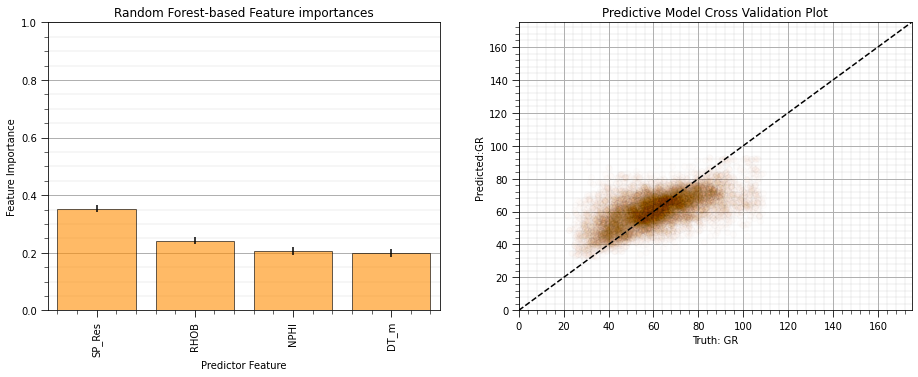

In [78]:
# Code modified from https://www.kaggle.com/kanncaa1/feature-selection-and-data-visualization
load_model = True; model_filename = 'rf_impute_GR'
seed = 73093                                                # set the random forest hyperparameters
max_depth = 7
min_samples_leaf = 5
num_tree = 1000
max_features = 4

x = df_sample.loc[:,sel_features].iloc[:,:-1]
Y = df_sample.loc[:,sel_features].iloc[:,-1:]

if load_model == False:
    random_forest = RandomForestRegressor(min_samples_leaf = min_samples_leaf,random_state=seed,n_estimators=num_tree, max_features=max_features)
    random_forest.fit(x,Y) # fit the random forest
    pickle.dump(random_forest, open(model_filename, 'wb')) # writte binary file
else:
    random_forest = pickle.load(open(model_filename, 'rb'))  # read binary file
    
y_hat = random_forest.predict(x)
importance_rank = random_forest.feature_importances_ # extract the expected feature importances
importance_rank_stand = importance_rank/np.max(importance_rank)                          # calculate relative mutual information

std = np.std([tree.feature_importances_ for tree in random_forest.estimators_],axis=0) # calculate stdev over trees
indices = np.argsort(importance_rank)[::-1]             # find indicies for descending order

plt.subplot(121)                                        # plot the feature importance 
plt.title("Random Forest-based Feature importances")
plt.bar(range(x.shape[1]), importance_rank[indices],edgecolor = 'black',
       color="darkorange",alpha = 0.6, yerr=std[indices], align="center")
plt.xticks(range(x.shape[1]), x.columns[indices],rotation=90)
plt.xlim([-0.5, x.shape[1]-0.5]); 
plt.gca().yaxis.grid(True, which='major',linewidth = 1.0); plt.gca().yaxis.grid(True, which='minor',linewidth = 0.2) # add y grids
plt.gca().tick_params(which='major',length=7); plt.gca().tick_params(which='minor', length=4)
plt.gca().xaxis.set_minor_locator(AutoMinorLocator()); plt.gca().yaxis.set_minor_locator(AutoMinorLocator()) # turn on minor ticks
plt.ylim([0.,1.0])
plt.xlabel('Predictor Feature'); plt.ylabel('Feature Importance')

plt.subplot(122)                                         # model cross validation plot
plt.scatter(Y,y_hat,color='darkorange',edgecolor='black',alpha=0.01)
plt.grid(visible=True,which='both',axis='both')
plt.gca().xaxis.set_minor_locator(AutoMinorLocator(5)); plt.gca().yaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.gca().yaxis.grid(True, which='major',linewidth = 1.0); plt.gca().yaxis.grid(True, which='minor',linewidth = 0.2) # add y grids
plt.gca().xaxis.grid(True, which='major',linewidth = 1.0); plt.gca().xaxis.grid(True, which='minor',linewidth = 0.2) # add y grids
plt.gca().tick_params(which='major',length=7); plt.gca().tick_params(which='minor', length=4)
plt.xlim([fmin[1],fmax[1]]); plt.ylim([fmin[1],fmax[1]]); plt.xlabel('Truth: ' + f[1]); plt.ylabel('Predicted:' + f[1])
plt.plot([fmin[1],fmax[1]],[fmin[1],fmax[1]],color='black',ls='--'); plt.title('Predictive Model Cross Validation Plot')

plt.subplots_adjust(left=0.0, bottom=0.0, right=2., top=1., wspace=0.2, hspace=0.5); plt.show()

#### Improved Model Diagnostics

Let's improve the model cross validation scatter plot.

1. transparency to improve the understanding of local density and shape

2. use of binned frequency to visualize the actual frequency of cross validation results

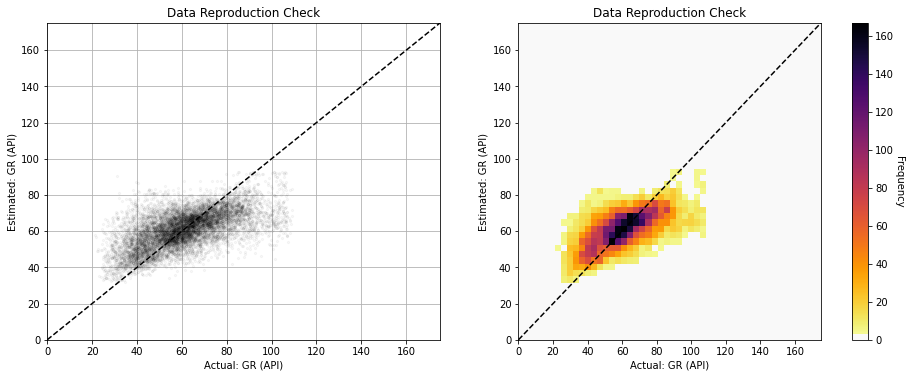

In [79]:
i = 1; nbins = 50
df_model_check = pd.DataFrame(np.vstack([Y.values.reshape(-1),y_hat]).T, columns= ['Actual: ' + f[i],'Predicted: ' + f[i]])

plt.subplot(121)    
#sns.kdeplot(data=df_model_check, x="Actual: f[i]", y="Predicted: f[i]",color='black',alpha=0.4,label ="Train Density") # estimate joint PDF
plt.scatter(Y.values.reshape(-1),y_hat,alpha=0.03,color='black',s=5)
plt.plot([fmin[i],fmax[i]],[fmin[i],fmax[i]],color='black',linestyle='--')
plt.ylabel('Estimated: ' + f[i] + ' (' + funit[i] + ')'); plt.xlabel('Actual: ' + f[i] + ' (' + funit[i] + ')'); plt.title('Data Reproduction Check')
plt.grid(True); plt.xlim(fmin[i],fmax[i]); plt.ylim(fmin[i],fmax[i])

plt.subplot(122)
_,_,_,im = plt.hist2d(data=df_model_check, x='Actual: ' + f[i], y='Predicted: ' + f[i],bins=(nbins,nbins),cmap=mask_inferno_r,color='black',
        alpha=1.0,range=[[fmin[i],fmax[i]],[fmin[i],fmax[i]]],lw=0.0001)
plt.plot([fmin[i],fmax[i]],[fmin[i],fmax[i]],color='black',linestyle='--')
plt.ylabel('Estimated: ' + f[i] + ' (' + funit[i] + ')'); plt.xlabel('Actual: ' + f[i] + ' (' + funit[i] + ')'); plt.title('Data Reproduction Check')
cbar = plt.colorbar(im,location='right',pad=0.08); cbar.set_label('Frequency', rotation=270, labelpad=10)

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=1.1, wspace=0.2, hspace=0.2); plt.show() 

#### Check the Distributions

Check the global distribution of the estimates vs. the true values.

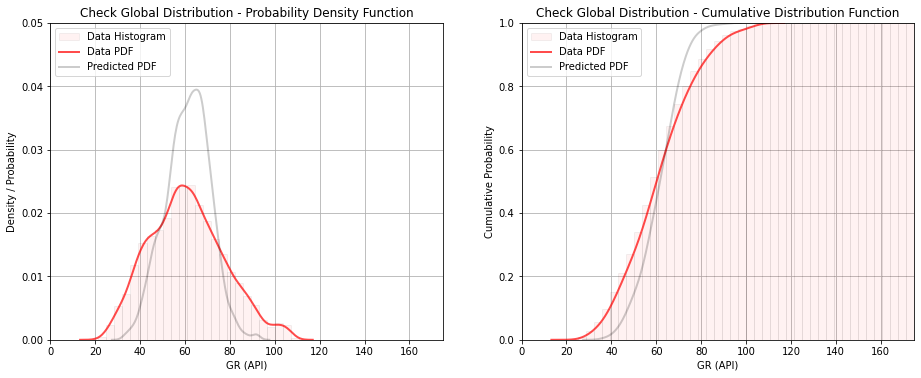

In [80]:
plt.subplot(121)
plt.hist(df_model_check['Actual: ' + f[i]].values,density=True,bins=np.linspace(fmin[i],fmax[i],50),color='red',alpha=0.05,edgecolor='black',label='Data Histogram')
plt.xlabel(f[i] + ' (' + funit[i] + ')'); plt.ylabel('Density / Probability'); plt.title('Check Global Distribution - Probability Density Function')
sns.kdeplot(df_model_check['Actual: ' + f[i]].values, color = 'red',alpha=0.7,linewidth=2.0,label='Data PDF')
sns.kdeplot(df_model_check['Predicted: ' + f[i]].values, color = 'black',alpha=0.2,linewidth = 2,label='Predicted PDF')
plt.xlim([fmin[i],fmax[i]]); plt.ylim([0,0.05]); plt.grid(True); plt.legend(loc='upper left')

plt.subplot(122)
plt.hist(df_model_check['Actual: ' + f[i]].values,density=True,bins=np.linspace(fmin[i],fmax[i],50),color='red',alpha=0.05,edgecolor='black',label='Data Histogram',cumulative=True)
plt.xlabel(f[i] + ' (' + funit[i] + ')'); plt.ylabel('Cumulative Probability'); plt.title('Check Global Distribution - Cumulative Distribution Function')
sns.kdeplot(df_model_check['Actual: ' + f[i]].values, color = 'red',alpha=0.7,linewidth=2,cumulative=True,label='Data PDF')
sns.kdeplot(df_model_check['Predicted: ' + f[i]].values, color = 'black',alpha=0.2,linewidth = 2,cumulative=True,label='Predicted PDF')
plt.xlim([fmin[i],fmax[i]]); plt.ylim([0,1]); plt.grid(True); plt.legend(loc='upper left')

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=1.1, wspace=0.2, hspace=0.2); plt.show()

#### Check for Conditional Bias

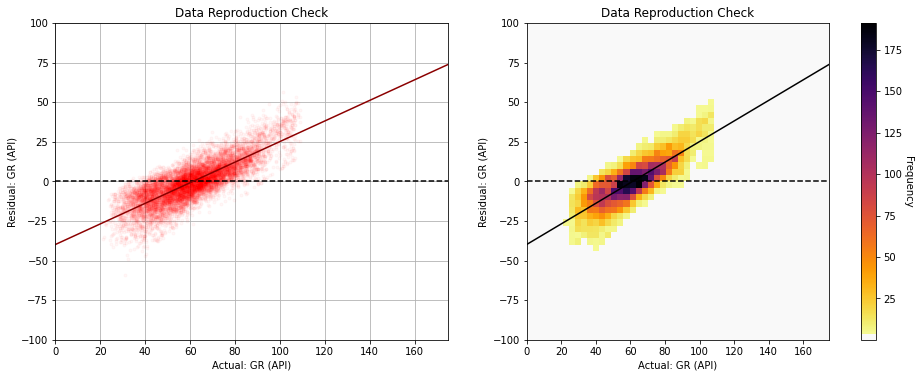

In [82]:
viz_range = 100.0

df_model_check['Residual: ' + f[i]] = df_model_check['Actual: ' + f[i]] - df_model_check['Predicted: ' + f[i]]

lin_slope,lin_int,_,_,_ = stats.linregress(Y.values.reshape(-1),df_model_check['Residual: ' + f[i]].values)
pred_values = np.linspace(fmin[i],fmax[i],100); res_values = np.linspace(fmin[i],fmax[i],100)*lin_slope + lin_int 

plt.subplot(121)    
#sns.kdeplot(data=df_model_check, x="Actual: f[i]", y="Predicted: f[i]",color='black',alpha=0.4,label ="Train Density") # estimate joint PDF
plt.scatter(Y.values.reshape(-1),df_model_check['Residual: ' + f[i]].values,alpha=0.03,color='red',s=10)
plt.plot([fmin[i],fmax[i]],[0,0],color='black',linestyle='--')
plt.plot(pred_values,res_values,color='darkred')
plt.ylabel('Residual: ' + f[i] + ' (' + funit[i] + ')'); plt.xlabel('Actual: ' + f[i] + ' (' + funit[i] + ')'); plt.title('Data Reproduction Check')
plt.grid(True); plt.xlim(fmin[i],fmax[i]); plt.ylim(-viz_range,viz_range)

plt.subplot(122)
_,_,_,im = plt.hist2d(data=df_model_check, x='Actual: ' + f[i], y='Residual: ' + f[i],bins=(nbins,nbins),cmap=mask_inferno_r,color='black',
        alpha=1.0,range=[[fmin[i],fmax[i]],[-viz_range,viz_range]],lw=0.0001,vmin=0.1)
plt.plot([fmin[i],fmax[i]],[0,0],color='black',linestyle='--')
plt.plot(pred_values,res_values,color='black')
plt.ylabel('Residual: ' + f[i] + ' (' + funit[i] + ')'); plt.xlabel('Actual: ' + f[i] + ' (' + funit[i] + ')'); plt.title('Data Reproduction Check')
cbar = plt.colorbar(im,location='right',pad=0.08); cbar.set_label('Frequency', rotation=270, labelpad=10)

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=1.1, wspace=0.2, hspace=0.2); plt.show() 

#### Comprehensive Random Forest Regressor Tuning

The run time is quite long. I left it running on a RTX 2080 for 2 days and stopped it earlier. 

* will refine search (currently brute force) and speed up

In [83]:
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.pipeline import Pipeline
# from sklearn.model_selection import GridSearchCV
# from sklearn.model_selection import KFold

# x = df_sample.loc[:,sel_features].iloc[:,:-1]
# Y = df_sample.loc[:,sel_features].iloc[:,-1:]
# Kfolds = 4

# pipe = Pipeline([                                           # the machine learning workflow as a pipeline object
#     ('rf', RandomForestRegressor())
# ])

# params = {                                                  # the machine learning workflow method's parameters
#     'rf__n_estimators': np.arange(25,300,25,dtype = int),
#     'rf__max_leaf_nodes': np.arange(2,50,6,dtype = int),
#     'rf__max_features': np.arange(1,len(x),1,dtype = int),
#     'rf__random_state': [73073]
# }

# grid_cv_tuned = GridSearchCV(pipe, params, scoring = 'neg_mean_squared_error', # grid search cross validation 
#                              cv=KFold(n_splits=folds,shuffle=False),
#                              refit = True)

# grid_cv_tuned.fit(x,Y)                                 # fit model with tuned hyperparameters

# y_hat = random_forest.predict(x)
# importance_rank = random_forest.feature_importances_ # extract the expected feature importances
# importance_rank_stand = importance_rank/np.max(importance_rank)                          # calculate relative mutual information

# std = np.std([tree.feature_importances_ for tree in random_forest.estimators_],axis=0) # calculate stdev over trees
# indices = np.argsort(importance_rank)[::-1]             # find indicies for descending order

# plt.subplot(121)                                        # plot the feature importance 
# plt.title("Random Forest-based Feature importances")
# plt.bar(range(x.shape[1]), importance_rank[indices],edgecolor = 'black',
#        color="darkorange",alpha = 0.6, yerr=std[indices], align="center")
# plt.xticks(range(x.shape[1]), x.columns[indices],rotation=90)
# plt.xlim([-0.5, x.shape[1]-0.5]); 
# plt.gca().yaxis.grid(True, which='major',linewidth = 1.0); plt.gca().yaxis.grid(True, which='minor',linewidth = 0.2) # add y grids
# plt.gca().tick_params(which='major',length=7); plt.gca().tick_params(which='minor', length=4)
# plt.gca().xaxis.set_minor_locator(AutoMinorLocator()); plt.gca().yaxis.set_minor_locator(AutoMinorLocator()) # turn on minor ticks
# plt.ylim([0.,1.0])
# plt.xlabel('Predictor Feature'); plt.ylabel('Feature Importance')

# plt.subplot(122)                                         # model cross validation plot
# plt.scatter(Y,y_hat,color='darkorange',edgecolor='black',alpha=0.7)
# plt.grid(visible=True,which='both',axis='both')
# plt.gca().xaxis.set_minor_locator(AutoMinorLocator(5)); plt.gca().yaxis.set_minor_locator(AutoMinorLocator(5)) 
# plt.gca().yaxis.grid(True, which='major',linewidth = 1.0); plt.gca().yaxis.grid(True, which='minor',linewidth = 0.2) # add y grids
# plt.gca().xaxis.grid(True, which='major',linewidth = 1.0); plt.gca().xaxis.grid(True, which='minor',linewidth = 0.2) # add y grids
# plt.gca().tick_params(which='major',length=7); plt.gca().tick_params(which='minor', length=4)
# plt.xlim([fmin[1],fmax[1]]); plt.ylim([fmin[1],fmax[1]]); plt.xlabel('Truth: ' + f[1]); plt.ylabel('Predicted:' + f[1])
# plt.plot([fmin[1],fmax[1]],[fmin[1],fmax[1]],color='black',ls='--'); plt.title('Predictive Model Cross Validation Plot')

# plt.subplots_adjust(left=0.0, bottom=0.0, right=2., top=1., wspace=0.2, hspace=0.5); plt.show()

#### SP Extreme-based Workflow for Classification of Sand and Shale

Number of original records = 1725533.
Number of records after filter = 1578411 , Percentage retained = 91.5%


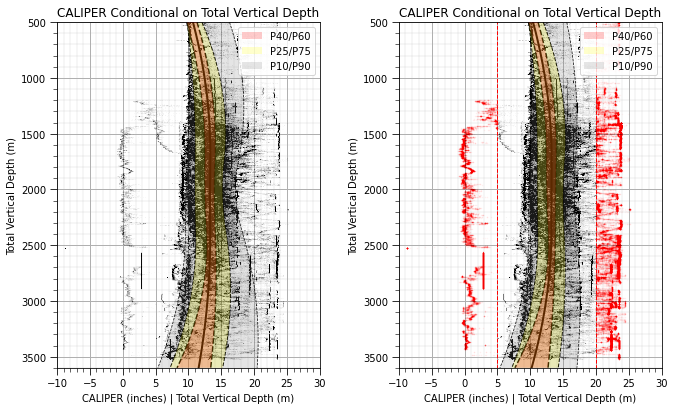

In [84]:
df['filter1'] = np.zeros(len(df))

min_cal = 5; max_cal = 20
df['filter1'] = np.where((df['CALIPER'] < min_cal) | (df['CALIPER'] > max_cal),1,0)

df_keep = df[df['filter1'] == 0]
df_remove = df[df['filter1'] == 1]

print('Number of original records = ' + str(len(df)) + '.')
print('Number of records after filter = ' + str(len(df_keep)) + ' , Percentage retained = ' + str(round(len(df_keep)/len(df),3)*100) + '%')

plt.subplot(121)
i = 5
P50spline, P10spline, P90spline = cond_prob_plot_rot(df['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df[f[i]],fmin[i],fmax[i],f[i],funit[i])

plt.subplot(122)
i = 5
P50spline, P10spline, P90spline = cond_prob_plot_rot(df_keep['TVD'].values,500,dmax,'Total Vertical Depth','m',5,
                                                     df_keep[f[i]],fmin[i],fmax[i],f[i],funit[i])
plt.scatter(df_remove[f[i]],df_remove['TVD'],color='red',s=1,alpha=0.01)
plt.vlines(min_cal,dmin,dmax,color='red',ls='--',lw=1); plt.vlines(max_cal,dmin,dmax,color='red',ls='--',lw=1)

plt.subplots_adjust(left=0.0, bottom=0.0, right=1.4, top=1.2, wspace=0.3, hspace=0.2); plt.show()

#### Calculate SP Trend with Depth

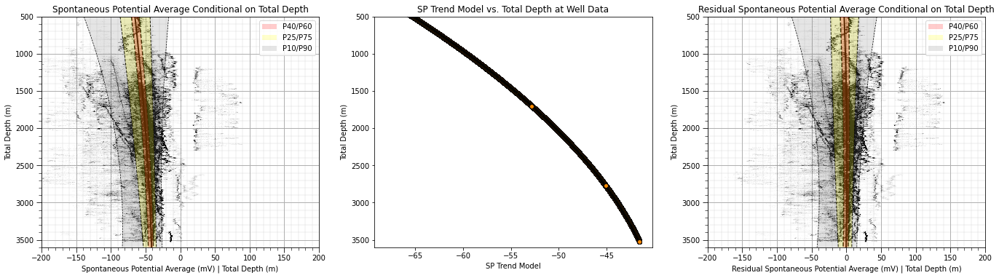

In [85]:
alpha = 0.2

df_keep_tempSP = df_keep[['TVD','SP','GR']].copy(deep=True).dropna()

plt.subplot(131)
SP_keep_depth_model,_,_ = cond_prob_plot_rot(df_keep_tempSP['TVD'].values,500,dmax,'Total Depth','m',3,
                df_keep_tempSP['SP'].values,-200,200,'Spontaneous Potential Average','mV',alpha=alpha)

df_keep_tempSP['SP_Depth_Trend'] = SP_keep_depth_model(df_keep_tempSP['TVD'].values)
df_keep_tempSP['SP_Depth_Residual'] = df_keep_tempSP['SP'] - df_keep_tempSP['SP_Depth_Trend']
df_keep['SP_Res'] = df_keep_tempSP['SP_Depth_Residual']

plt.subplot(132)
plt.scatter(df_keep_tempSP['SP_Depth_Trend'],df_keep_tempSP['TVD'],facecolor='darkorange',alpha=0.8,color='black')
plt.ylabel('Total Depth (m)'); plt.xlabel('SP Trend Model'); plt.title('SP Trend Model vs. Total Depth at Well Data')
plt.ylim([dmax,500])

plt.subplot(133)
SP_depth_exp,SP_depth_lower,SP_depth_upper = cond_prob_plot_rot(df_keep_tempSP['TVD'].values,500,dmax,'Total Depth','m',3,
                df_keep_tempSP['SP_Depth_Residual'].values,-200,200,'Residual Spontaneous Potential Average','mV',alpha=alpha)

plt.subplots_adjust(left=0.0, bottom=0.0, right=3.0, top=1.1, wspace=0.2, hspace=0.2); plt.show()

#### Sand/Shale Classification by SP Residual Extremes

Number of original records = 1578411.
Number of sand = 159246 , Percentage = 10.1%
Number of shale = 158615 , Percentage = 10.0%
Number of mixed = 1260550 , Percentage = 79.9%


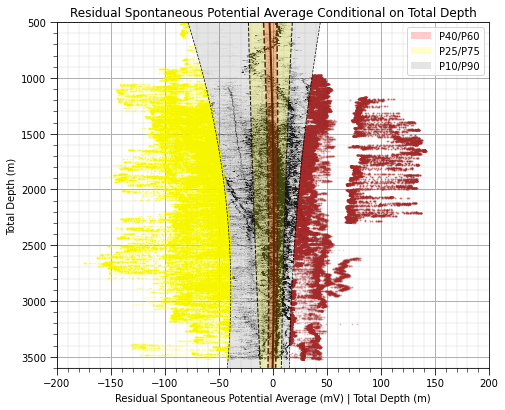

In [86]:
i = 4 # SP log

SP_lower = SP_depth_lower(df_keep['TVD'].values); SP_upper = SP_depth_upper(df_keep['TVD'].values)

df_keep['SP_facies'] = np.full(shape = len(df_keep),fill_value = '-1',dtype=np.int32)

df_keep['SP_facies'] = np.where(df_keep['SP_Res'].values < SP_lower.reshape((SP_lower.shape[0])),1,df_keep['SP_facies']) #sand

df_keep['SP_facies'] = np.where(df_keep['SP_Res'].values > SP_upper.reshape((SP_upper.shape[0])),0,df_keep['SP_facies']) # shale
                         

df_keep_sand = df_keep[df_keep['SP_facies'] == 1]
df_keep_shale = df_keep[df_keep['SP_facies'] == 0]
df_keep_mixed = df_keep[df_keep['SP_facies'] == -1]

print('Number of original records = ' + str(len(df_keep)) + '.')
print('Number of sand = ' + str(len(df_keep_sand)) + ' , Percentage = ' + str(round(len(df_keep_sand)/len(df_keep)*100,1)) + '%')
print('Number of shale = ' + str(len(df_keep_shale)) + ' , Percentage = ' + str(round(len(df_keep_shale)/len(df_keep)*100,1)) + '%')
print('Number of mixed = ' + str(len(df_keep_mixed)) + ' , Percentage = ' + str(round(len(df_keep_mixed)/len(df_keep)*100,1)) + '%')

plt.subplot(111)
_,_,_ = cond_prob_plot_rot(df_keep_tempSP['TVD'].values,500,dmax,'Total Depth','m',3,
                df_keep_tempSP['SP_Depth_Residual'].values,-200,200,'Residual Spontaneous Potential Average','mV',alpha=alpha)

plt.scatter(df_keep_sand['SP_Res'],df_keep_sand['TVD'],color='yellow',s=1,edgecolor='yellow',alpha=0.1)
plt.scatter(df_keep_shale['SP_Res'],df_keep_shale['TVD'],color='brown',s=1,edgecolor='brown',alpha=0.1)

plt.subplots_adjust(left=0.0, bottom=0.0, right=1.0, top=1.2, wspace=0.8, hspace=0.2); plt.show()

### Check the Sand, Shale and Mixed Distributions

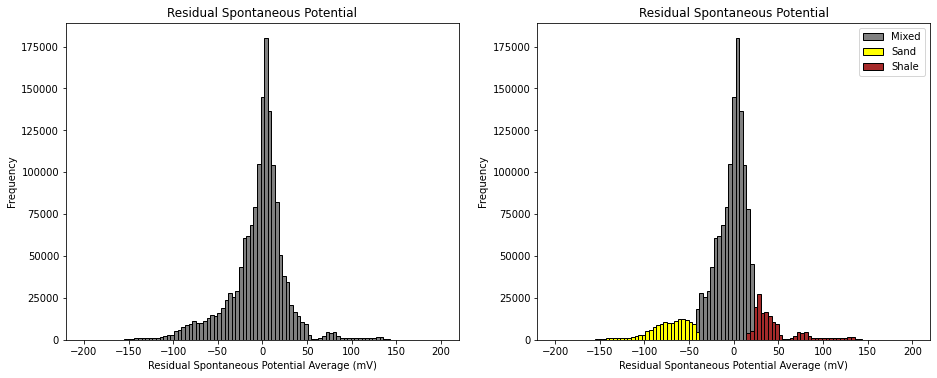

In [87]:
plt.subplot(121)
plt.hist(df_keep['SP_Res'].values,bins=np.linspace(-200,200,100),color='grey',edgecolor='black')
plt.xlabel('Residual Spontaneous Potential Average (mV)'); plt.ylabel('Frequency'); plt.title('Residual Spontaneous Potential')

plt.subplot(122)
plt.hist(df_keep_mixed['SP_Res'].values,bins=np.linspace(-200,200,100),color='grey',edgecolor='black',label='Mixed')
plt.hist(df_keep_sand['SP_Res'].values,bins=np.linspace(-200,200,100),color='yellow',edgecolor='black',label='Sand')
plt.hist(df_keep_shale['SP_Res'].values,bins=np.linspace(-200,200,100),color='brown',edgecolor='black',label='Shale')
plt.xlabel('Residual Spontaneous Potential Average (mV)'); plt.ylabel('Frequency'); plt.title('Residual Spontaneous Potential')
plt.legend(loc='upper right')

plt.subplots_adjust(left=0.0, bottom=0.0, right=2.0, top=1.1, wspace=0.2, hspace=0.2); plt.show()

#### Check Facies Scatter Plot

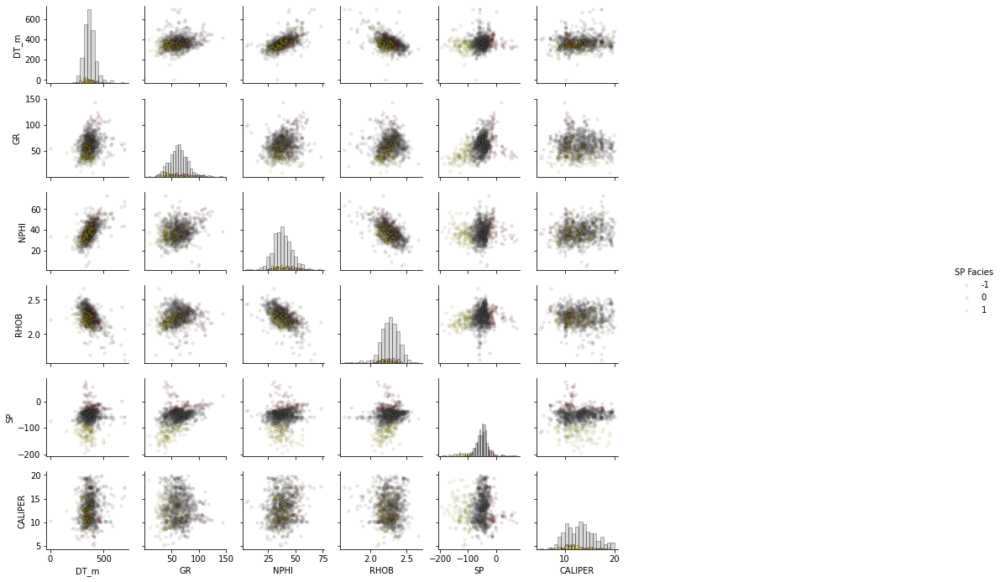

In [89]:
nsample_keep = 1000
if nsample_keep > 0:
    df_sample_keep = df_keep.sample(n=nsample_comp)
else: 
    df_sample_keep = df_keep

pairgrid = sns.PairGrid(df_sample_keep,vars = f,hue='SP_facies',palette = ['grey','brown','yellow'])
pairgrid = pairgrid.map_upper(plt.scatter,edgecolor = 'black', alpha = 0.1, s = 10)
pairgrid = pairgrid.map_lower(plt.scatter,edgecolor = 'black', alpha = 0.1, s = 10)
pairgrid = pairgrid.map_diag(plt.hist, bins = 20,alpha = 0.3, edgecolor = 'k')# Map a density plot to the lower triangle

pairgrid.add_legend(title = 'SP Facies')
plt.subplots_adjust(left=0.0, bottom=0.0, right=0.6, top=0.6, wspace=0.2, hspace=0.2)

#### Save New FIltered Well Data

In [62]:
df_keep.to_csv('Filtered_Wells_SandShale.csv')

#### Next Steps

* Review of results

* Machine learning model to predict sand and shale facies for automated classification of facies from well data

* Modeling of SP/GR trends by-facies 

* Assess opportunities for dimensionality reduction, inferential machine learning

#### February 3rd - Next Steps

* new data logs, e.g., deep resitivity

##### Enhanced Normalization

* check local by well distributions, develop and apply local window normalization, region-based normalization

* refine filters, e.g., RHOB (1-1.5 salt), local outlier detection methods

* methods to classify / cluster by vintage

* improve facies identification, clean sand identification, e.g., PCA / rotation of sonic & density combination (f(RHOB/DT_m)

* interactive data visualization

* big data approaches, e.g., dask, PySpark,  and GPU enabled, e.g., nvidia RAPIDS

* by-facies GR imputation

Student Research Prototyping / Demonstrations

* **Midé Mabadeje** – 4th year Ph.D. working on modeling in low dimensional space, e.g., like the song hit detector, analog selection methods
* **Misael Morales** - 2nd year Ph.D. working on deep learning for data integration and prediction, petrophysics and geophysics, dimensionality reduction
* **Eduardo Maldonado Cruz** – 4th year Ph.D. working on self-supervised learning and physics proxy models with deep learning
* **Laaiba Akmal** – 1st year M.Sc. working on discrepancy modeling, e.g., hybrid use of a physics-based model and deep learning for well log imputation
